In [ ]:
#!pip install -U scikit-learn scipy matplotlib

In [2]:
import numpy as np
from sklearn.metrics import confusion_matrix, precision_recall_curve
import matplotlib.pyplot as plt
import os
import itertools
import glob
from utils import *


In [3]:
iou_treshold = 0.5
CONFIDENCE_THRESHOLD = 0.2
IMAGE_WIDTH = 2464
IMAGE_HEIGHT = 2056

SYNTETIC_DATA_DIRECTORY = '/cluster/home/solveijm/DNV_synthetic_data_w_pose'
CREATE_TESTSET = False

# Syntethic data folders to be tested on

We have trained on: 
- '2023-04-26_1656_dnv_scenario1_full_00_000_MorningClear' 
- '2023-04-26_1658_dnv_scenario1_full_00_000_MorningCloudy'
- Hurtigruta dataset

In [4]:
light_condition1 = ['2023-05-09_1328_dnv_scenario1_full_00_000_NoonClear']
light_condition2 = ['2023-05-09_1257_dnv_scenario1_full_00_000_AfternoonClear']
light_condition3 = ['2023-05-09_1308_dnv_scenario1_full_00_000_EveningClear']
light_condition4 = ['2023-05-09_1324_dnv_scenario1_full_00_000_NightClear']

cloud_light1 = ['2023-05-09_1330_dnv_scenario1_full_00_000_NoonCloudy']
cloud_light2 = ['2023-05-09_1300_dnv_scenario1_full_00_000_AfternoonCloudy']
cloud_light3 = ['2023-05-09_1311_dnv_scenario1_full_00_000_EveningCloudy']
cloud_light4 = ['2023-05-09_1326_dnv_scenario1_full_00_000_NightCloudy']

rain_light1 = ['2023-05-09_1332_dnv_scenario1_full_00_000_NoonCloudy_Rain']
rain_light2 = ['2023-05-09_1302_dnv_scenario1_full_00_000_AfternoonCloudy_Rain']
rain_light3 = ['2023-05-09_1313_dnv_scenario1_full_00_000_EveningCloudy_Rain']

foggy = ['2023-05-09_1315_dnv_scenario1_full_00_000_FoggyClear']
foggy_cloudy = ['2023-05-09_1317_dnv_scenario1_full_00_000_FoggyCloudy']

stormy = ['2023-05-09_1339_dnv_scenario1_full_00_000_StormClouds']
stormy_rain = ['2023-05-09_1341_dnv_scenario1_full_00_000_StormyClouds_Rain']


all_conditions = [light_condition1, light_condition2, light_condition3, light_condition4, cloud_light1, cloud_light2, cloud_light3, cloud_light4, rain_light1, rain_light2, rain_light3, foggy, foggy_cloudy, stormy, stormy_rain]
all_conditions_names = ['light_condition1', 'light_condition2', 'light_condition3', 'light_condition4', 'cloud_light1', 'cloud_light2', 'cloud_light3', 'cloud_light4', 'rain_light1', 'rain_light2', 'rain_light3', 'foggy', 'foggy_cloudy', 'stormy', 'stormy_rain']


## Create test set for each folder

In [5]:
if CREATE_TESTSET:
    test_sets = {}

    for i, condition in enumerate(all_conditions):
        all_image_paths = []
        for folder in condition:
            path = os.path.join(SYNTETIC_DATA_DIRECTORY, folder)+'/images/'
            image_paths = glob.glob(f'{path}*.jpg')
            for image in image_paths:
                all_image_paths.append(os.path.join(path, image))
        test_file = os.path.join(SYNTETIC_DATA_DIRECTORY, f'test_{all_conditions_names[i]}.txt')
        test_sets[all_conditions_names[i]] = test_file
        with open(test_file, 'w+') as f:
            f.writelines('\n'.join(all_image_paths))
    print(test_sets)


# Test after training on hurtigruta

### Light condition 1

In [6]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_100e_1024imgsz_only_hurtigruta_correct/weights/best.pt source='/cluster/home/solveijm/DNV_synthetic_data_w_pose/2023-05-09_1328_dnv_scenario1_full_00_000_NoonClear/test.txt' imgsz=1024 name=test_light_condition1_1024imgz_only_hurtigruta_correct_18_05 save=True save_conf=True save_txt=True

Displaying stats
Confusion matrix:
[[211  47]
 [ 97   0]]
Precision:
0.8178294573643411
Recall:
0.685064935064935


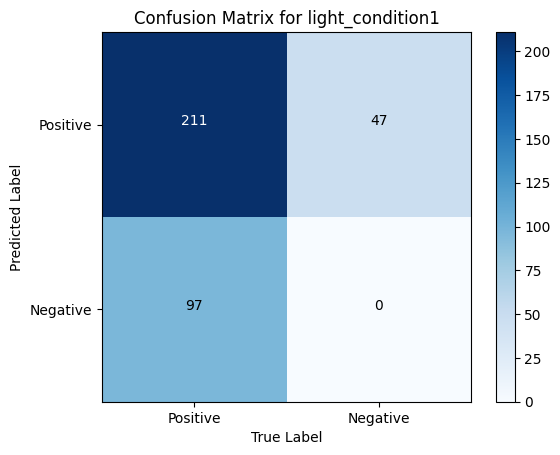

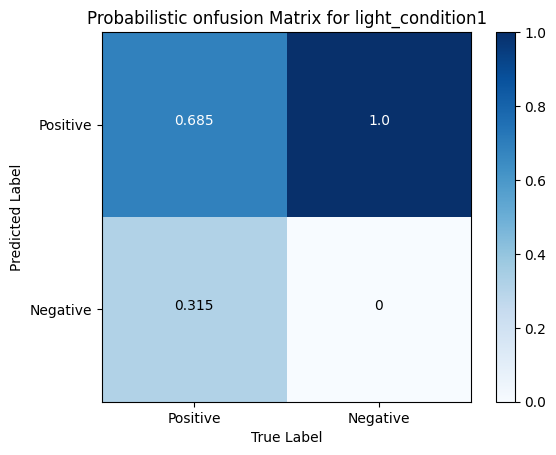

0.818 & 0.685 & 0.685 & 0.315 & 47


BOUNDING BOX ERRORS FOR light_condition1
IoU threshold:  0.5
Error of center x
198
Expected value: 4.411769565727697
Standard deviation: 3.8189424825770635

Error of center y
76
Expected value: 8.247670197183105
Standard deviation: 12.178268555498311

Error of width
198
Expected value: -5.351777816901419
Standard deviation: 10.25484695261645

Error of height
78
Expected value: 13.257793258215964
Standard deviation: 35.076853848831156
4.412 & 3.819 & 8.248 & 12.178 & -5.352 & 10.255 & 13.258 & 35.077


 DROPOUT STATS


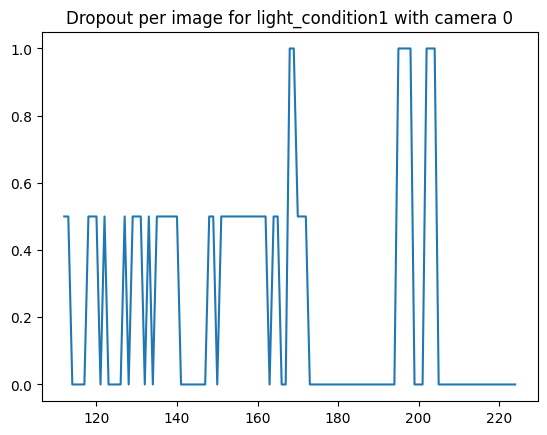

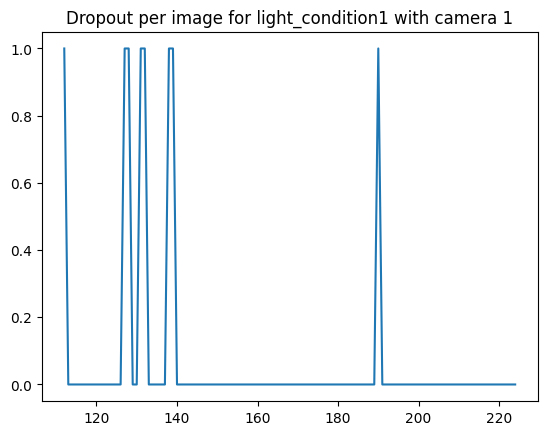

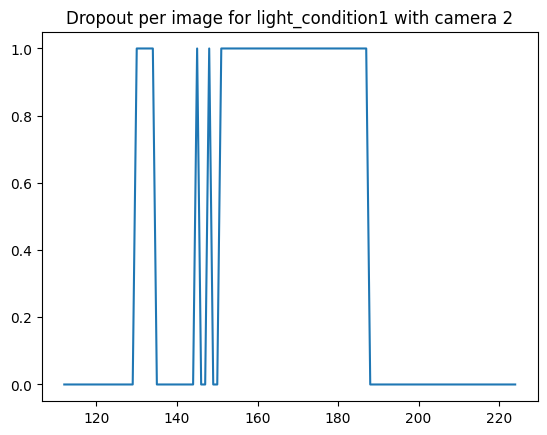

In [ ]:
condition_name = 'light_condition1'
condition_folders = light_condition1
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]

PREDICTED_PATH = '../../runs/detect/test_light_condition1_1024imgz_only_hurtigruta_correct_18_05/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name='light_condition1')

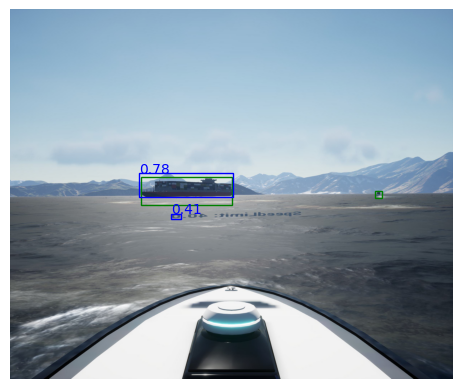

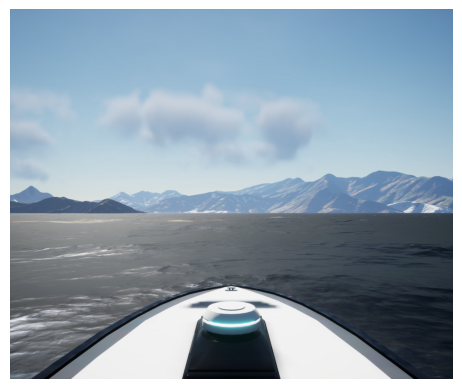

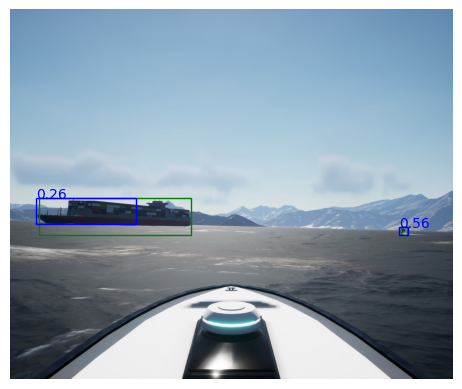

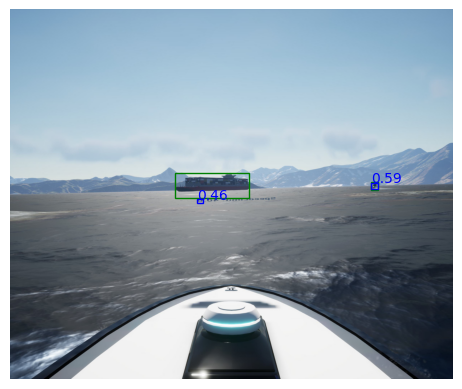

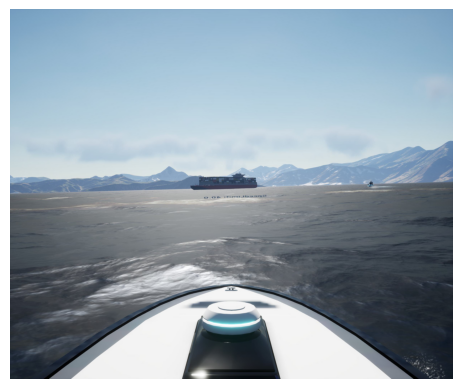

...

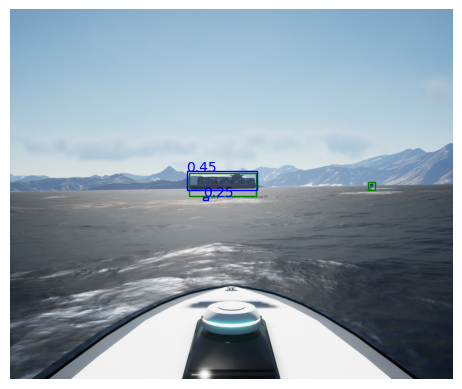

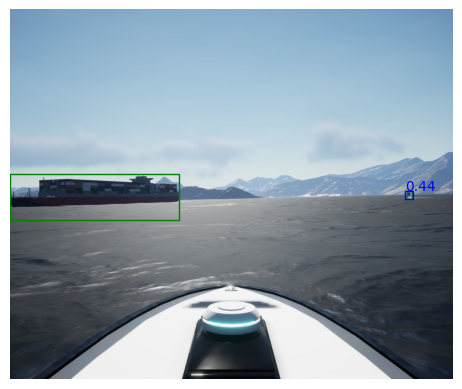

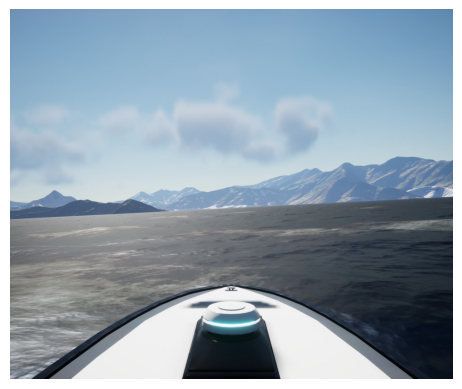

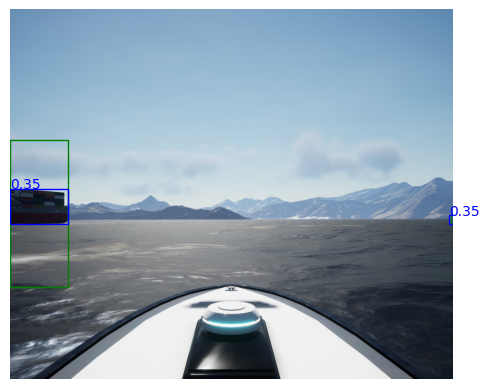

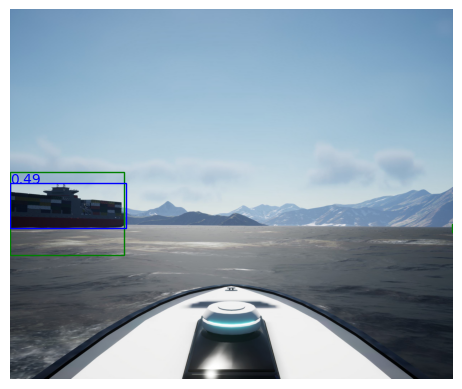

In [9]:
image_dir = GROUND_TRUTH_PATHS[0]+'/images/'

#['CAM00_img209', 'CAM00_img046', 'CAM00_img049', 'CAM00_img047']
#ct = 0.59
#for image in ['CAM00_img129']:
for image in ['CAM00_img129', 'CAM00_img209', 'CAM00_img149', 'CAM00_img118','CAM00_img111', 'CAM00_img130', 'CAM00_img128', 'CAM00_img223', 'CAM00_img112', 'CAM00_img152','CAM00_img201', 'CAM00_img170', 'CAM00_img165']:
    display_predicted(image, image_dir, ground_truth_annots, predicted_detections, CONFIDENCE_THRESHOLD)

# Run tests after training on Hurtigruta and a mix of synthetic data
- The trained model is saved to: train_50e_1024imgz_mixed_synthetic_and_hurtigruta_correct_idun
- To run test for each condition run the python script test_each_synthetic_codnition.py

## Different light conditions

### Light condition 1

In [ ]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_50e_1024imgz_mixed_synthetic_and_hurtigruta_correct_idun/weights/best.pt source='/cluster/home/solveijm/DNV_synthetic_data_w_pose/2023-05-09_1328_dnv_scenario1_full_00_000_NoonClear/test.txt' imgsz=1024 name=test_light_condition1_1024imgz_hurtigruta_and_synthetic save=True save_conf=True save_txt=True

Displaying stats
Confusion matrix:
[[228  70]
 [ 80   0]]
Precision:
0.7651006711409396
Recall:
0.7402597402597403


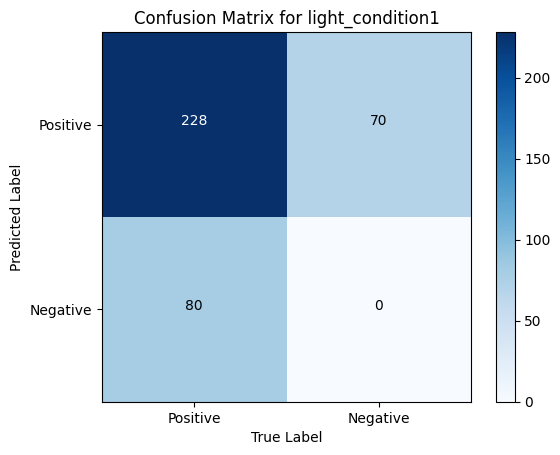

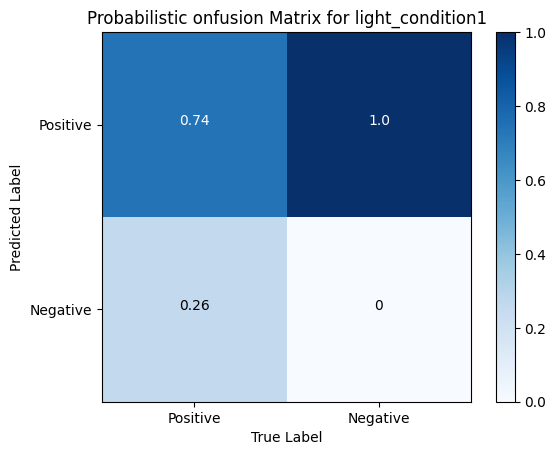

0.765 & 0.74 & 0.74 & 0.26 & 70


BOUNDING BOX ERRORS FOR light_condition1
IoU threshold:  0.7
Error of center x
227
Expected value: 1.1684560895196483
Standard deviation: 12.818442672162126

Error of center y
83
Expected value: 1.398734670305681
Standard deviation: 5.962350712596126

Error of width
56
Expected value: -7.200807524017481
Standard deviation: 26.300255087134797

Error of height
97
Expected value: 0.02888742794760529
Standard deviation: 7.367512781115772
1.168 & 12.818 & 1.399 & 5.962 & -7.201 & 26.3 & 0.029 & 7.368


 DROPOUT STATS


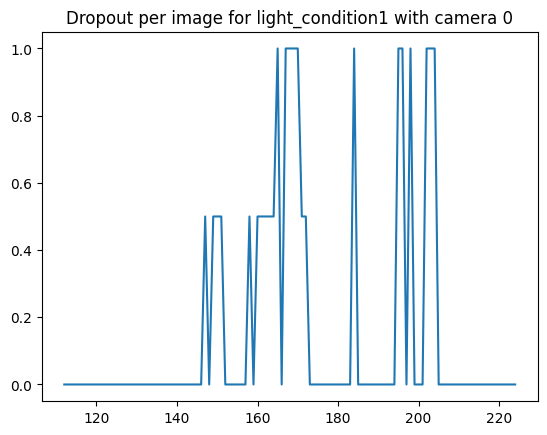

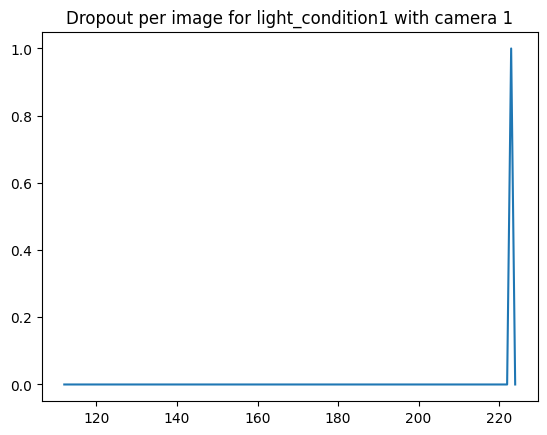

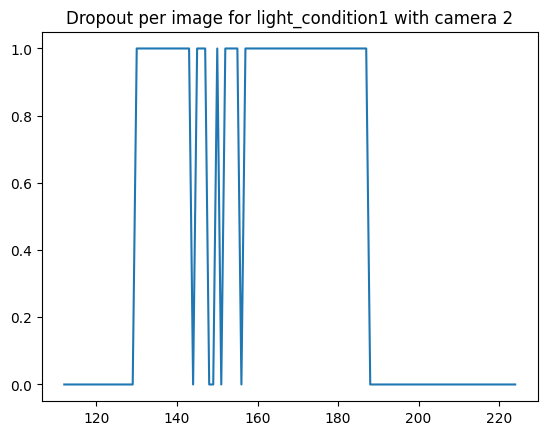

In [ ]:
condition_name = 'light_condition1'
condition_folders = light_condition1
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]

PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name='light_condition1')

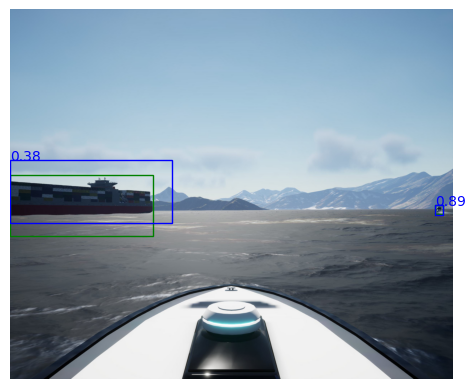

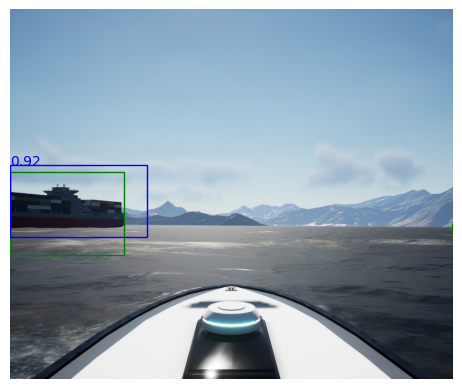

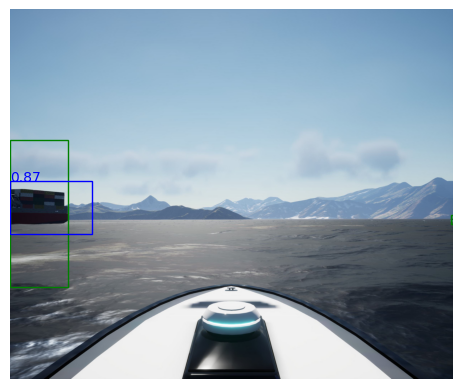

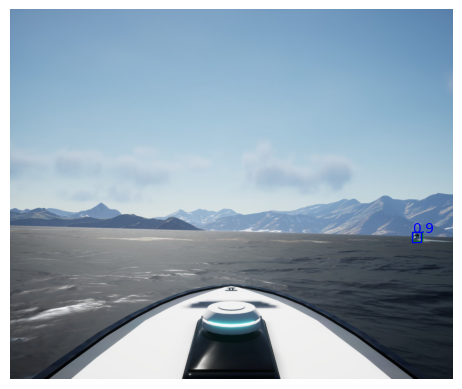

In [11]:
image_dir = GROUND_TRUTH_PATHS[0]+'/images/'

#['CAM00_img209', 'CAM00_img046', 'CAM00_img049', 'CAM00_img047']
#for image in ['CAM00_img209', 'CAM00_img149', 'CAM00_img118']:
#for image in ['CAM00_img209', 'CAM00_img149', 'CAM00_img118','CAM00_img111', 'CAM00_img130', 'CAM00_img128', 'CAM00_img223', 'CAM00_img112', 'CAM00_img152','CAM00_img201', 'CAM00_img170', 'CAM00_img165']:
for image in ['CAM00_img160', 'CAM00_img165', 'CAM00_img170', 'CAM00_img175']:
    display_predicted(image, image_dir, ground_truth_annots, predicted_detections, CONFIDENCE_THRESHOLD)

### Light condition 2

In [13]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_50e_1024imgz_mixed_synthetic_and_hurtigruta_correct_idun/weights/best.pt source='/cluster/home/solveijm/DNV_synthetic_data_w_pose/2023-05-09_1257_dnv_scenario1_full_00_000_AfternoonClear/test.txt' imgsz=1024 name=test_light_condition2_1024imgz_hurtigruta_and_synthetic save=True save_conf=True save_txt=True


Displaying stats
Confusion matrix:
[[245  33]
 [ 87   0]]
Precision:
0.8812949640287769
Recall:
0.7379518072289156


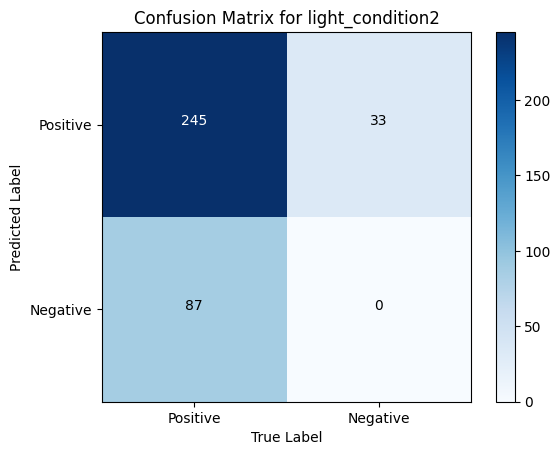

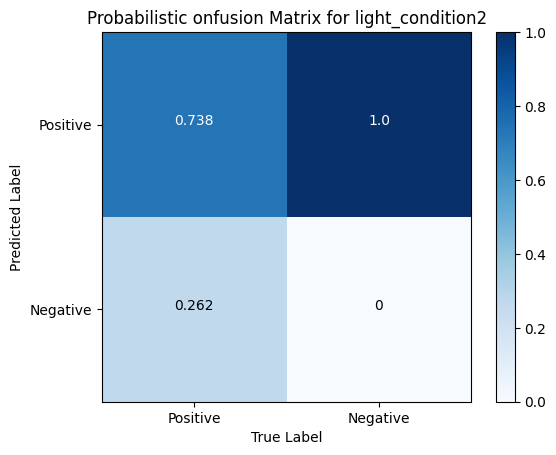

0.881 & 0.738 & 0.738 & 0.262 & 33


BOUNDING BOX ERRORS FOR light_condition2
IoU threshold:  0.5
Error of center x
250
Expected value: -1.4774138884462213
Standard deviation: 21.42278830861049

Error of center y
100
Expected value: 5.30721316733068
Standard deviation: 19.094273338492513

Error of width
74
Expected value: -7.700808693227089
Standard deviation: 44.08553340853769

Error of height
108
Expected value: 0.9080851952191191
Standard deviation: 22.36352232958217
-1.477 & 21.423 & 5.307 & 19.094 & -7.701 & 44.086 & 0.908 & 22.364


 DROPOUT STATS


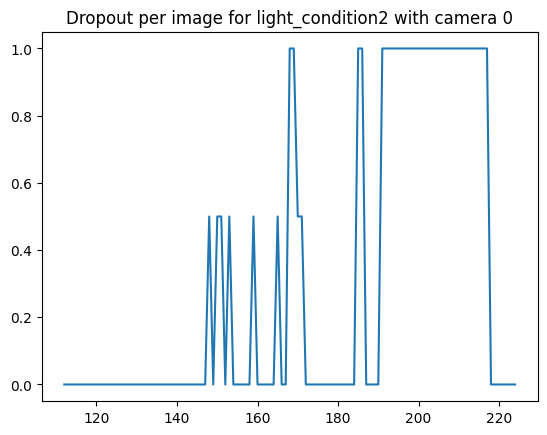

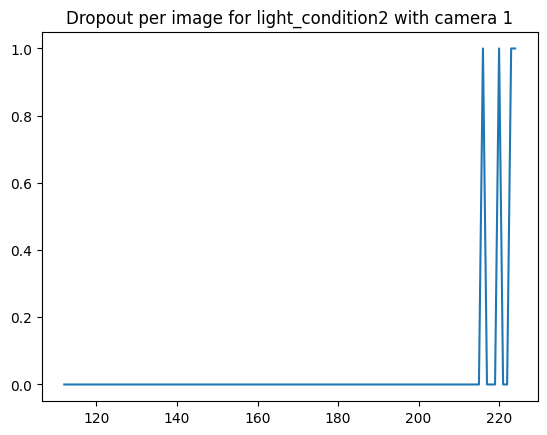

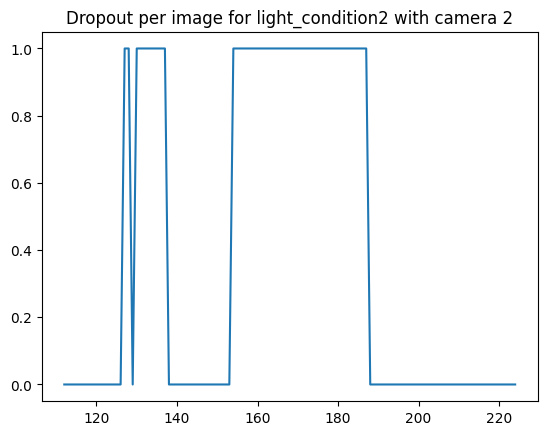

In [14]:
condition_name = 'light_condition2'
condition_folders = light_condition2
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

### Light condition 3

In [15]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_light_condition3.txt' imgsz=640 name=test_light_condition3 save=True save_conf=True save_txt=True

Displaying stats
Confusion matrix:
[[229  41]
 [ 83   0]]
Precision:
0.8481481481481481
Recall:
0.7339743589743589


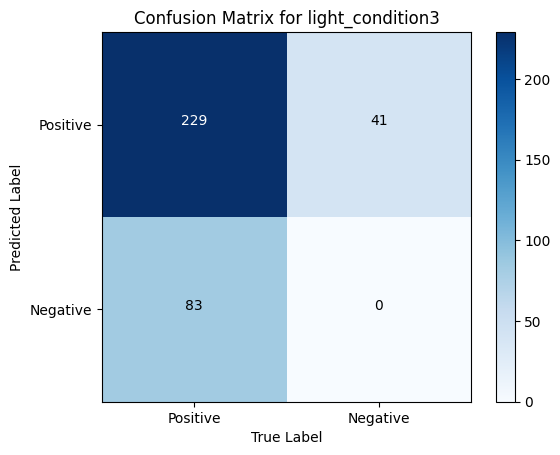

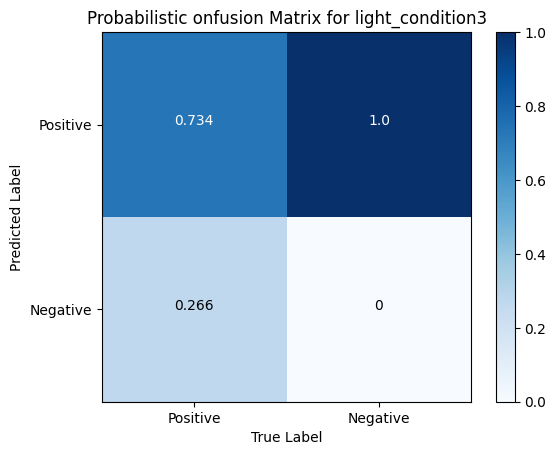

0.848 & 0.734 & 0.734 & 0.266 & 41


BOUNDING BOX ERRORS FOR light_condition3
IoU threshold:  0.5
Error of center x
230
Expected value: 3.727985616379313
Standard deviation: 21.321336805678918

Error of center y
231
Expected value: 3.0781390883620743
Standard deviation: 12.572942632168461

Error of width
230
Expected value: -6.7854944999999915
Standard deviation: 40.99050953453277

Error of height
231
Expected value: -1.325744392241379
Standard deviation: 22.713050036850667
3.728 & 21.321 & 3.078 & 12.573 & -6.785 & 40.991 & -1.326 & 22.713


 DROPOUT STATS


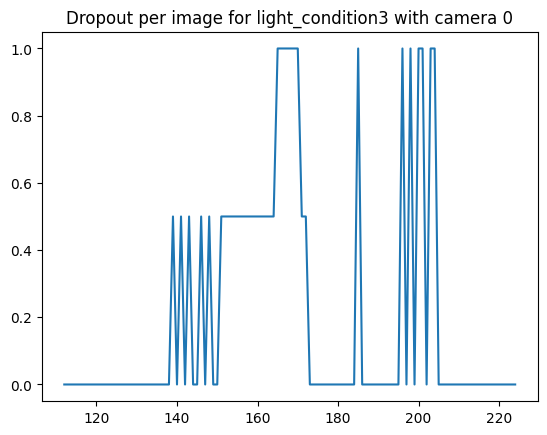

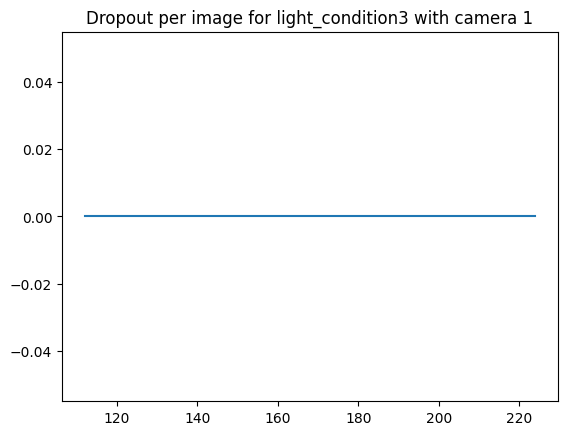

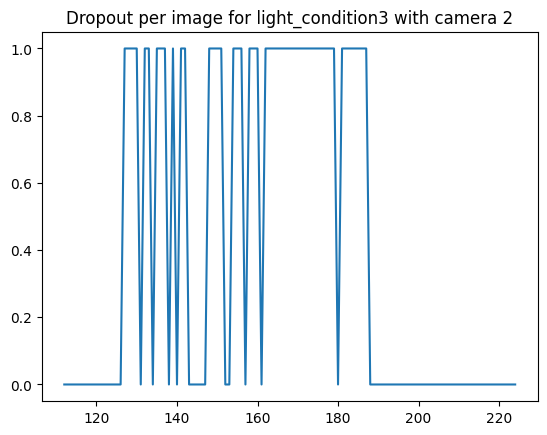

In [16]:
condition_name = 'light_condition3'
condition_folders = light_condition3
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

### Light condition 4

In [17]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_light_condition3.txt' imgsz=640 name=test_light_condition3 save=True save_conf=True save_txt=True

Displaying stats
Confusion matrix:
[[265  50]
 [ 42   0]]
Precision:
0.8412698412698413
Recall:
0.8631921824104235


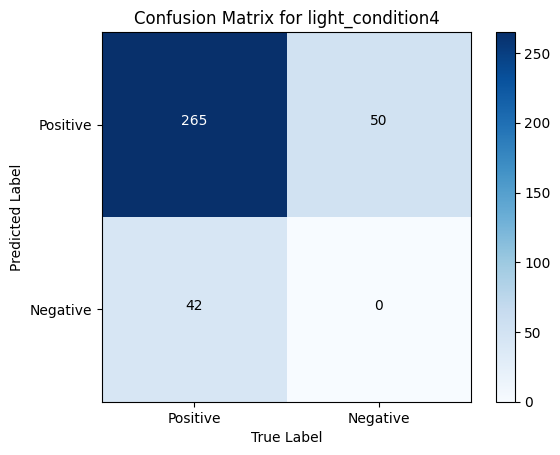

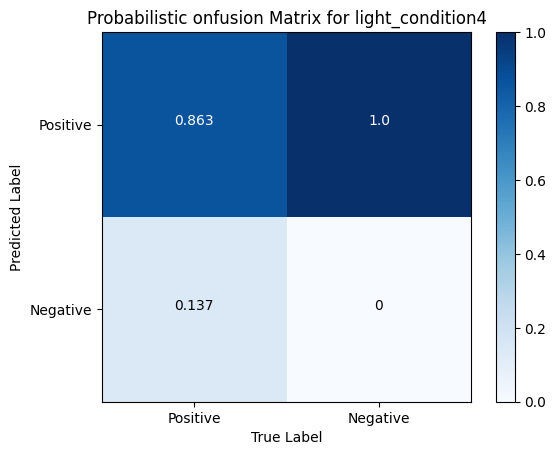

0.841 & 0.863 & 0.863 & 0.137 & 50


BOUNDING BOX ERRORS FOR light_condition4
IoU threshold:  0.5
Error of center x
273
Expected value: 10.290059510948907
Standard deviation: 62.795962958705154

Error of center y
106
Expected value: 9.409112412408765
Standard deviation: 22.171776480950715

Error of width
273
Expected value: -1.192706364963505
Standard deviation: 103.09035163757824

Error of height
109
Expected value: -3.0391030364963507
Standard deviation: 26.453362492392106
10.29 & 62.796 & 9.409 & 22.172 & -1.193 & 103.09 & -3.039 & 26.453


 DROPOUT STATS


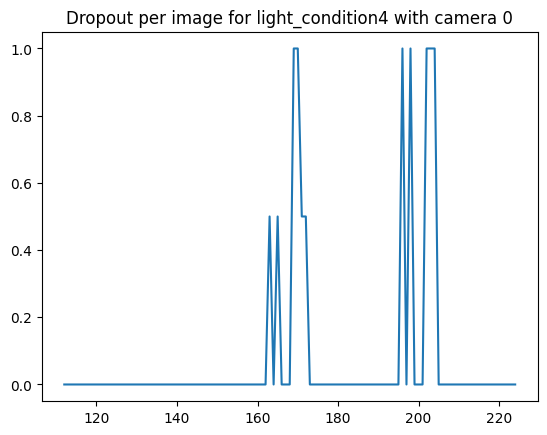

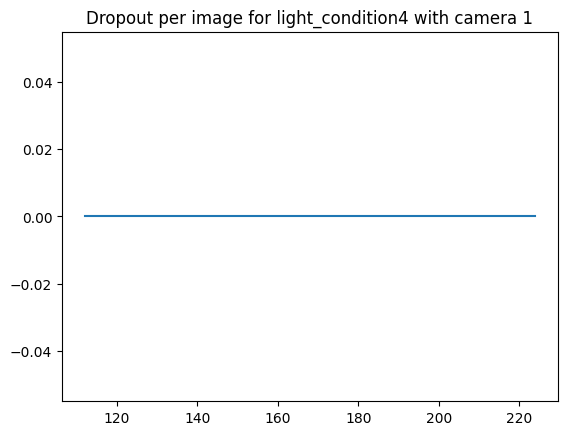

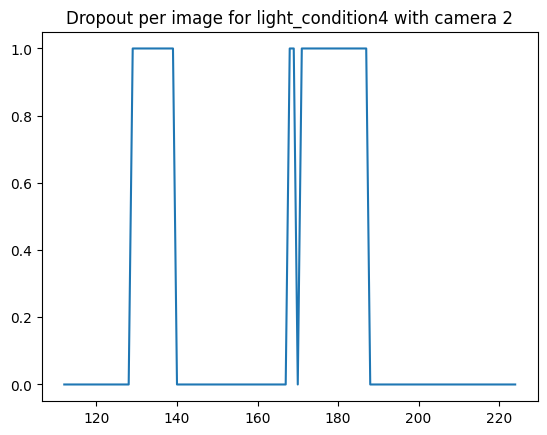

In [18]:
condition_name = 'light_condition4'
condition_folders = light_condition4
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

## Cloud in various light conditions

### Cloud and light1

In [19]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_cloud_light1.txt' imgsz=640 name=test_cloud_light1 save=True save_conf=True save_txt=True

Displaying stats
Confusion matrix:
[[269  32]
 [ 69   0]]
Precision:
0.893687707641196
Recall:
0.7958579881656804


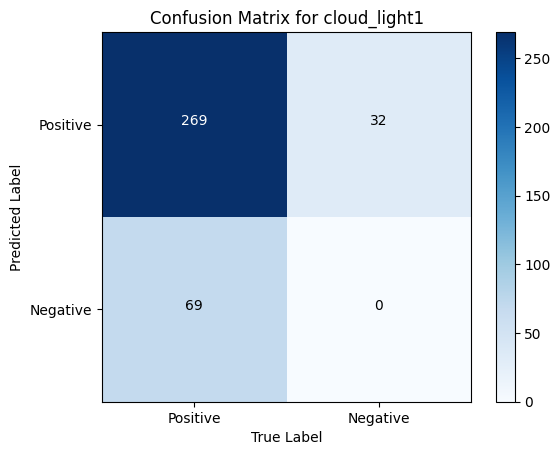

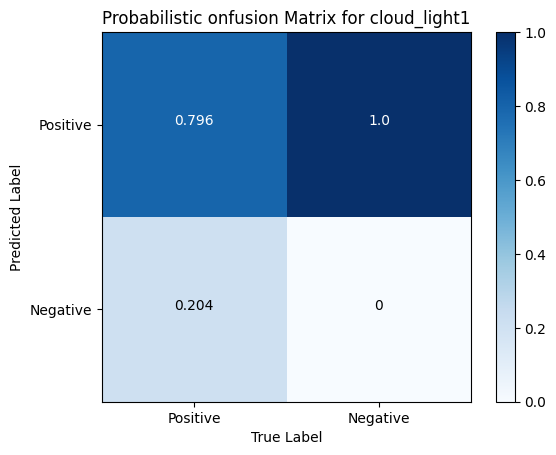

0.894 & 0.796 & 0.796 & 0.204 & 32


BOUNDING BOX ERRORS FOR cloud_light1
IoU threshold:  0.5
Error of center x
273
Expected value: 1.3547016763636435
Standard deviation: 26.461533621982912

Error of center y
274
Expected value: 3.8609788890909127
Standard deviation: 12.775185021321304

Error of width
273
Expected value: -2.9981345018181838
Standard deviation: 45.09542932234

Error of height
274
Expected value: 2.8183888909090893
Standard deviation: 25.453447578943408
1.355 & 26.462 & 3.861 & 12.775 & -2.998 & 45.095 & 2.818 & 25.453


 DROPOUT STATS


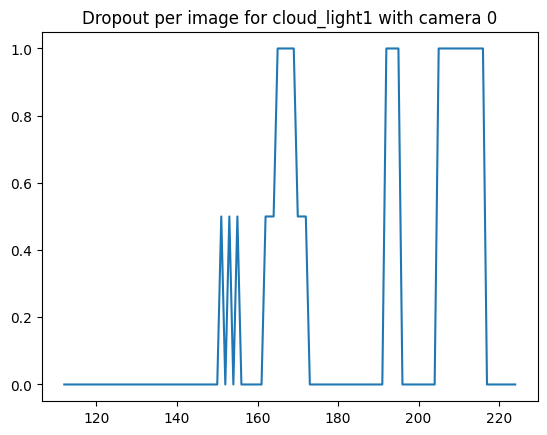

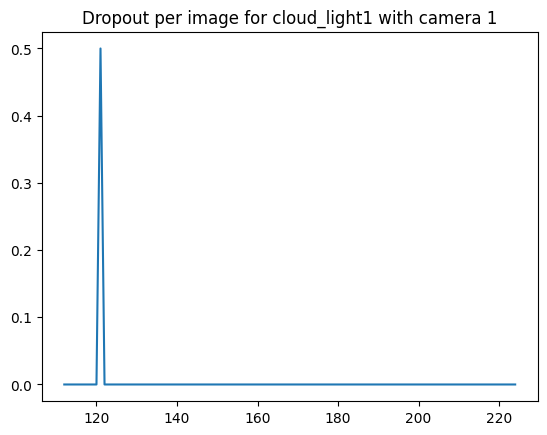

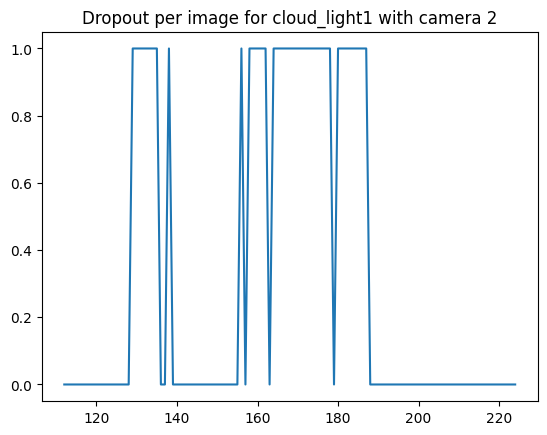

In [41]:
condition_name = 'cloud_light1'
condition_folders = cloud_light1
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD ,IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

### Cloud and light2

In [21]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_cloud_light2.txt' imgsz=640 name=test_cloud_light2 save=True save_conf=True save_txt=True

Displaying stats
Confusion matrix:
[[267  32]
 [ 43   0]]
Precision:
0.8929765886287625
Recall:
0.8612903225806452


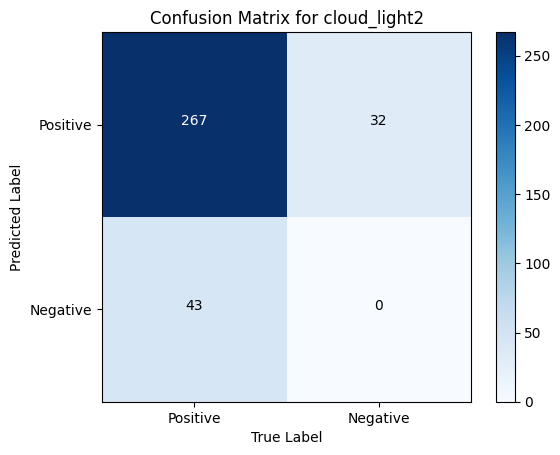

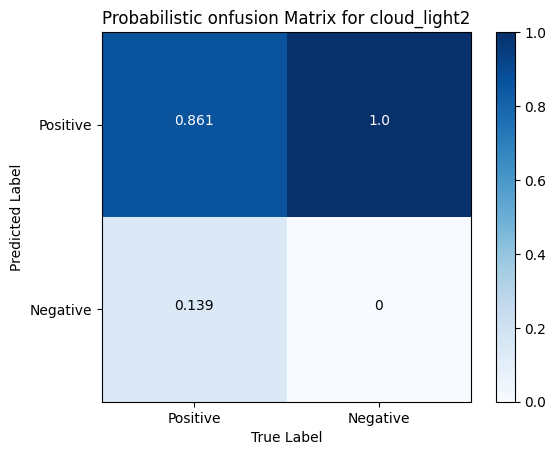

0.893 & 0.861 & 0.861 & 0.139 & 32


BOUNDING BOX ERRORS FOR cloud_light2
IoU threshold:  0.5
Error of center x
260
Expected value: 0.12472691604477838
Standard deviation: 49.766298478314766

Error of center y
264
Expected value: 9.20031909514925
Standard deviation: 22.103508413704773

Error of width
260
Expected value: -10.64565107835823
Standard deviation: 68.30084388413064

Error of height
267
Expected value: -5.619594966417915
Standard deviation: 35.77054076931358
0.125 & 49.766 & 9.2 & 22.104 & -10.646 & 68.301 & -5.62 & 35.771


 DROPOUT STATS


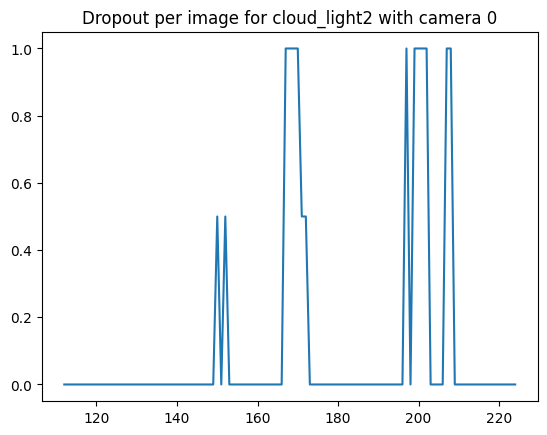

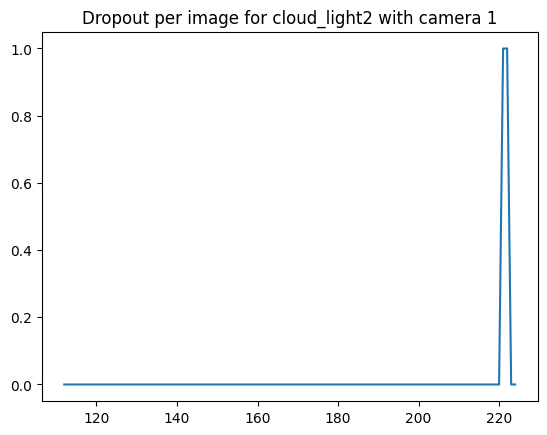

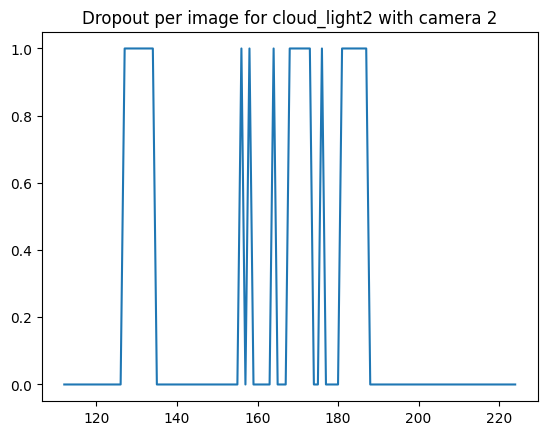

In [22]:
condition_name = 'cloud_light2'
condition_folders = cloud_light2
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

### Cloud and light 3

In [23]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_cloud_light3.txt' imgsz=640 name=test_cloud_light3 save=True save_conf=True save_txt=True


Displaying stats
Confusion matrix:
[[255  36]
 [ 80   0]]
Precision:
0.8762886597938144
Recall:
0.7611940298507462


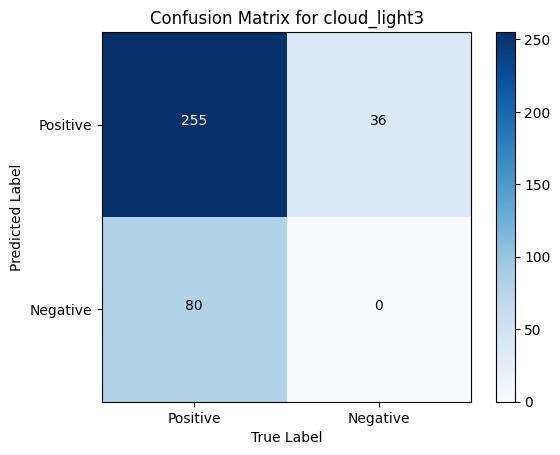

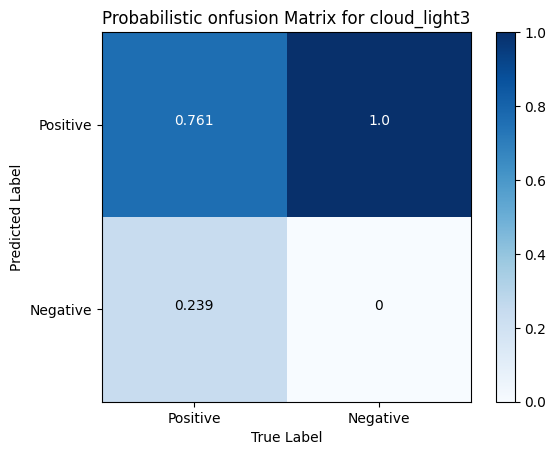

0.876 & 0.761 & 0.761 & 0.239 & 36


BOUNDING BOX ERRORS FOR cloud_light3
IoU threshold:  0.5
Error of center x
254
Expected value: 5.235546933333342
Standard deviation: 31.822089641889406

Error of center y
85
Expected value: 4.61193022549019
Standard deviation: 13.068706764356827

Error of width
254
Expected value: -12.636339686274507
Standard deviation: 50.60009240631487

Error of height
104
Expected value: -3.4324082156862774
Standard deviation: 19.678929200921463
5.236 & 31.822 & 4.612 & 13.069 & -12.636 & 50.6 & -3.432 & 19.679


 DROPOUT STATS


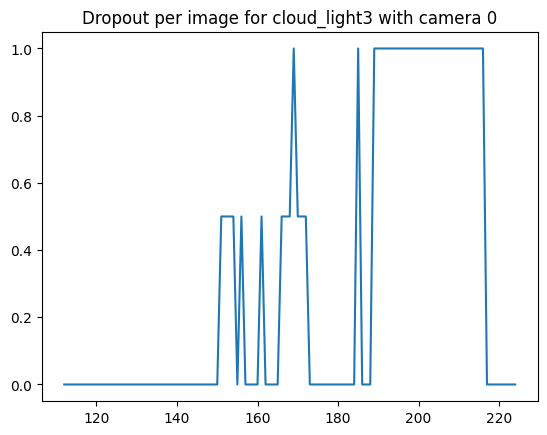

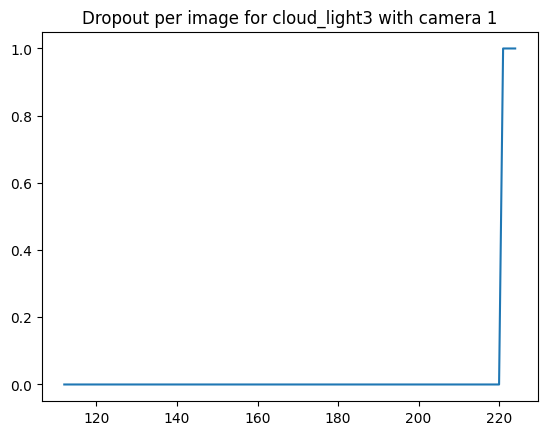

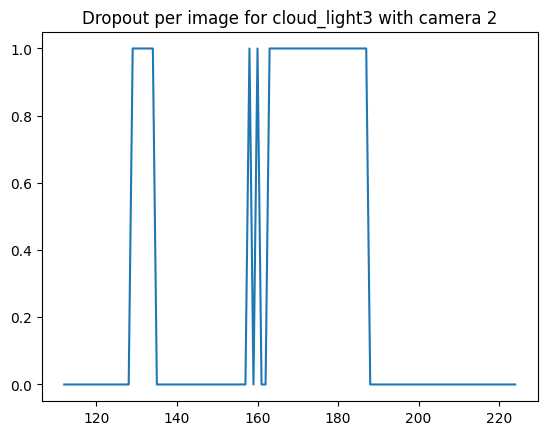

In [42]:
condition_name = 'cloud_light3'
condition_folders = cloud_light3
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

### Cloud and light4

In [25]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_cloud_light2.txt' imgsz=640 name=test_cloud_light2 save=True save_conf=True save_txt=True

Displaying stats
Confusion matrix:
[[267  41]
 [ 66   0]]
Precision:
0.8668831168831169
Recall:
0.8018018018018018


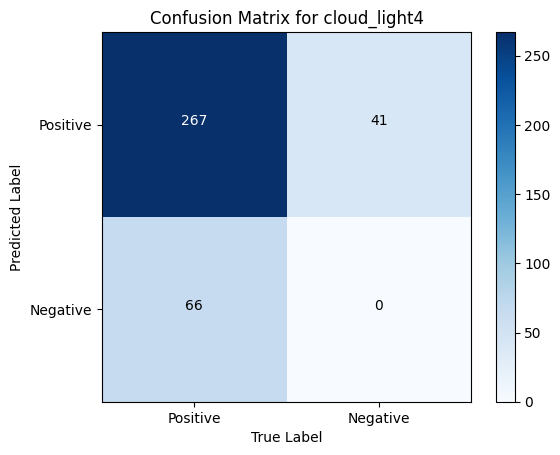

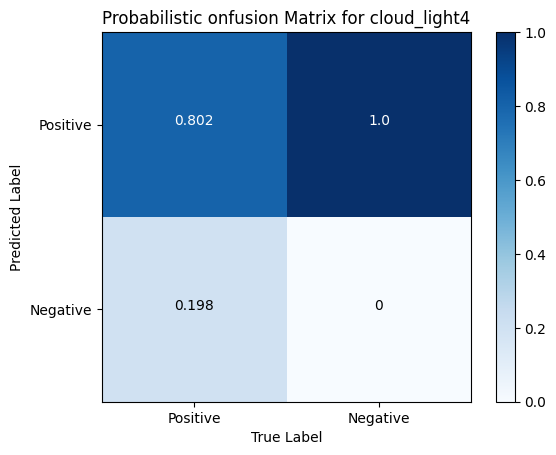

0.867 & 0.802 & 0.802 & 0.198 & 41


BOUNDING BOX ERRORS FOR cloud_light4
IoU threshold:  0.5
Error of center x
275
Expected value: 2.9298453339350203
Standard deviation: 59.5436951975603

Error of center y
112
Expected value: 8.327811660649822
Standard deviation: 21.516035463226945

Error of width
275
Expected value: -0.18039756317691233
Standard deviation: 98.6169206120314

Error of height
276
Expected value: -5.4439771985559515
Standard deviation: 29.58615271505941
2.93 & 59.544 & 8.328 & 21.516 & -0.18 & 98.617 & -5.444 & 29.586


 DROPOUT STATS


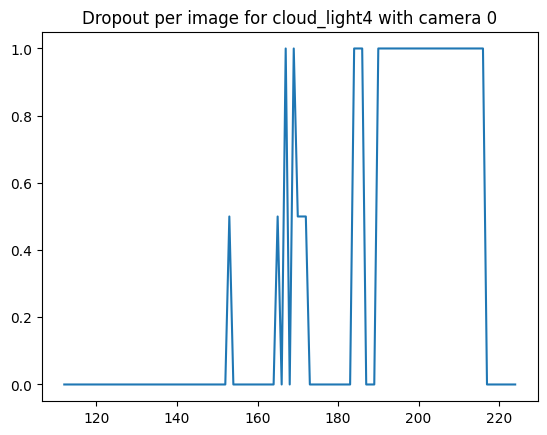

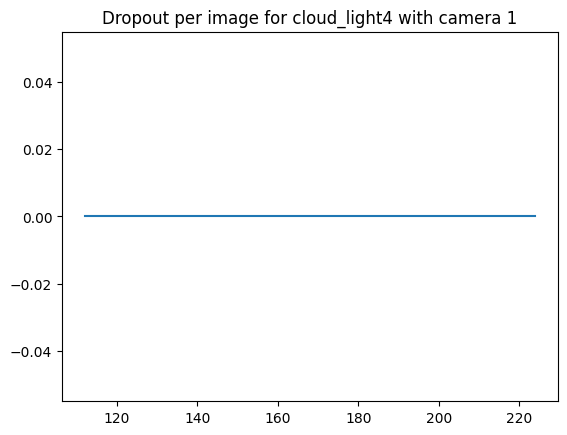

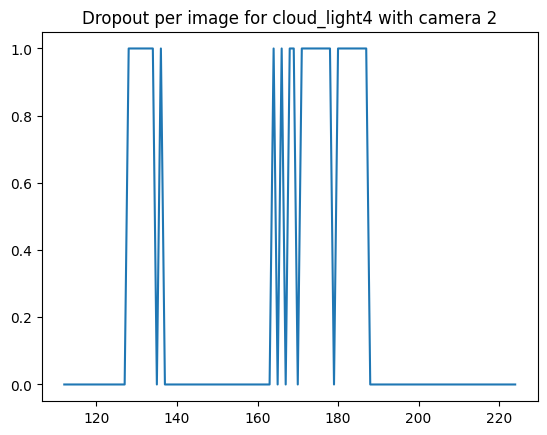

In [44]:
condition_name = 'cloud_light4'
condition_folders = cloud_light4
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

## Rain

### Rain light 1

In [27]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_rain_light1.txt' imgsz=640 name=test_rain_light1 save=True save_conf=True save_txt=True


Displaying stats
Confusion matrix:
[[257  27]
 [ 53   0]]
Precision:
0.9049295774647887
Recall:
0.8290322580645161


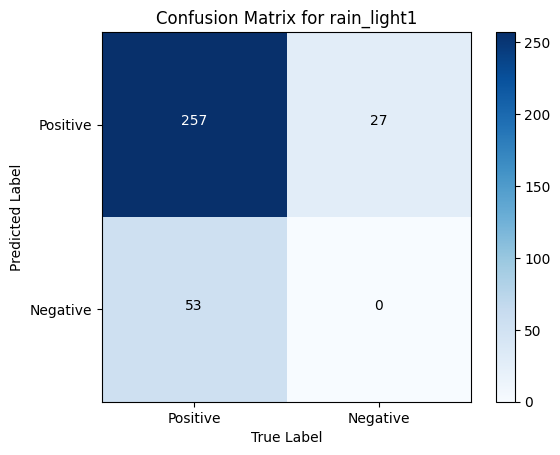

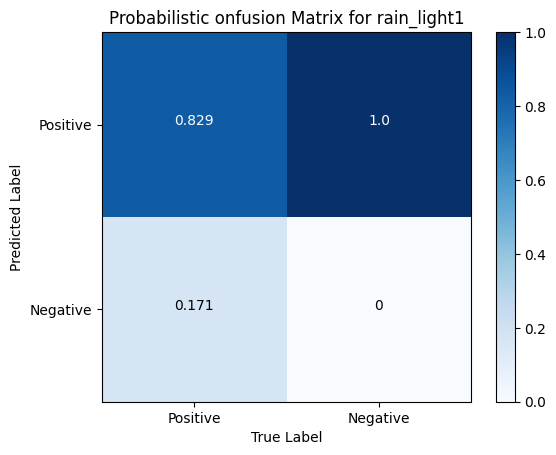

0.905 & 0.829 & 0.829 & 0.171 & 27


BOUNDING BOX ERRORS FOR rain_light1
IoU threshold:  0.5
Error of center x
255
Expected value: -3.9696022832699525
Standard deviation: 43.72083479585037

Error of center y
252
Expected value: 3.46451790494297
Standard deviation: 14.740087093140126

Error of width
256
Expected value: -3.2138100874524893
Standard deviation: 64.20113871514673

Error of height
262
Expected value: 2.8636014828897407
Standard deviation: 26.944721429767473
-3.97 & 43.721 & 3.465 & 14.74 & -3.214 & 64.201 & 2.864 & 26.945


 DROPOUT STATS


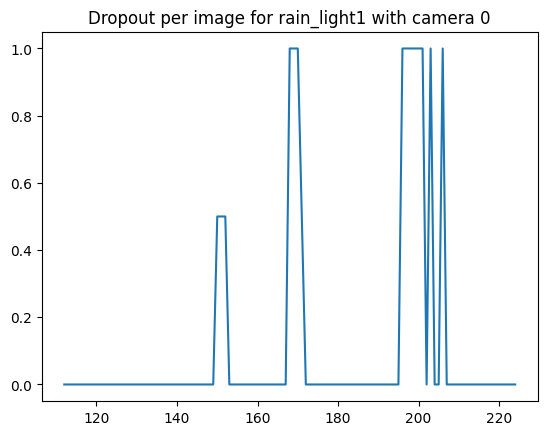

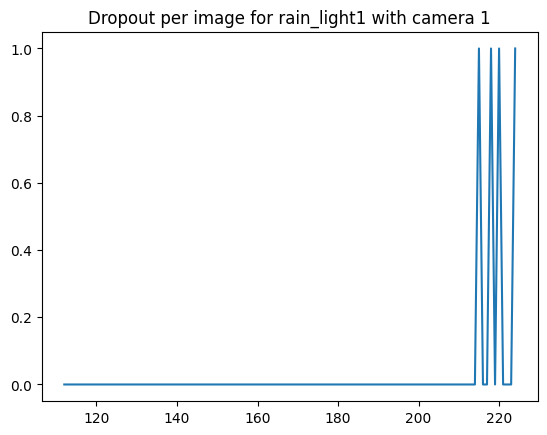

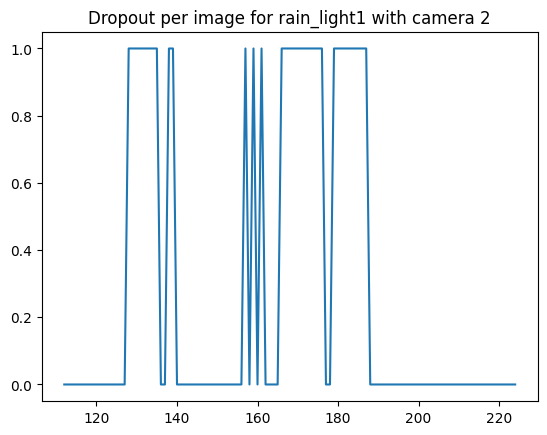

In [5]:
condition_name = 'rain_light1'
condition_folders = rain_light1
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

### Rain light 2

In [6]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_rain_light2.txt' imgsz=640 name=test_rain_light2 save=True save_conf=True save_txt=True


Displaying stats
Confusion matrix:
[[265  27]
 [ 41   0]]
Precision:
0.9075342465753424
Recall:
0.8660130718954249


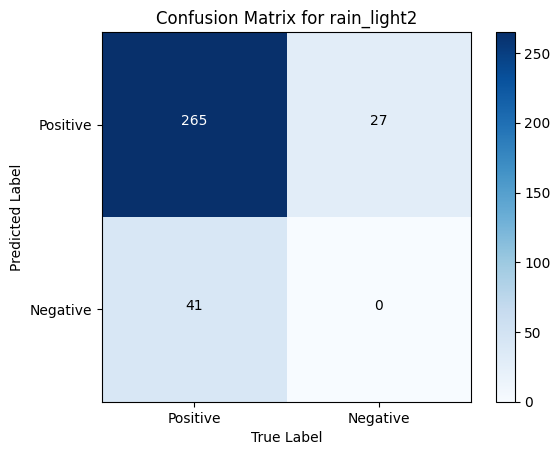

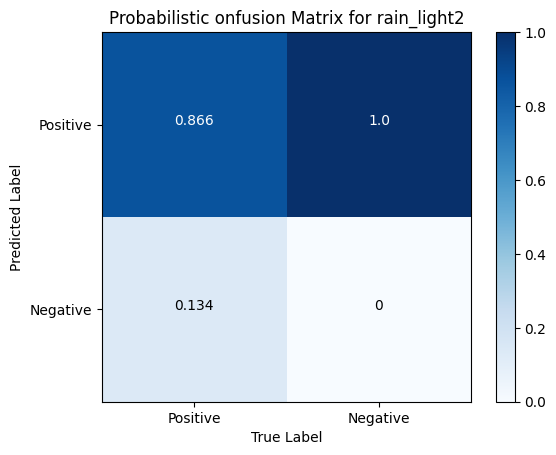

0.908 & 0.866 & 0.866 & 0.134 & 27


BOUNDING BOX ERRORS FOR rain_light2
IoU threshold:  0.5
Error of center x
262
Expected value: -1.0584659144981443
Standard deviation: 54.580472027281594

Error of center y
107
Expected value: 8.328299723048321
Standard deviation: 21.786365182061388

Error of width
264
Expected value: -10.583032959107802
Standard deviation: 80.15320424625361

Error of height
267
Expected value: -1.9330854609665415
Standard deviation: 39.84270293825622
-1.058 & 54.58 & 8.328 & 21.786 & -10.583 & 80.153 & -1.933 & 39.843


 DROPOUT STATS


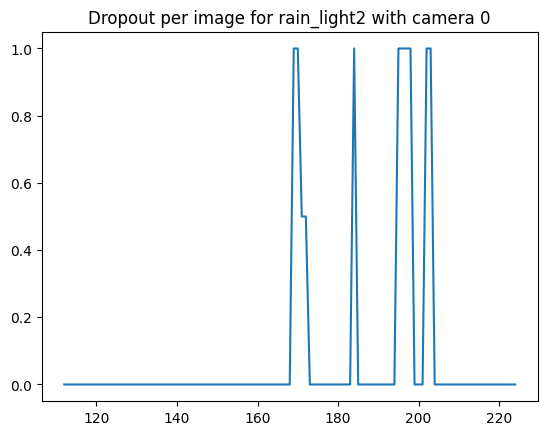

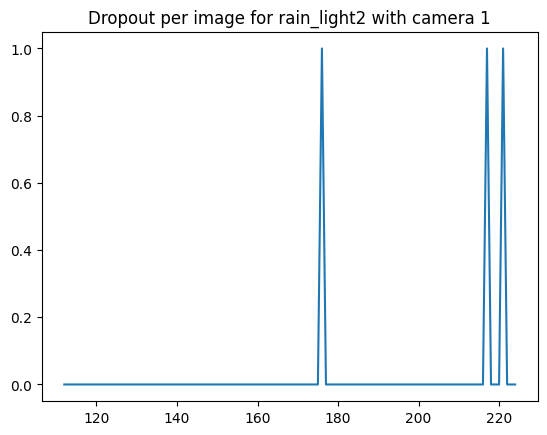

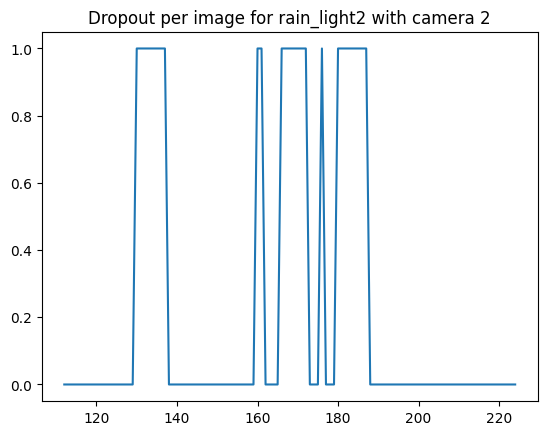

In [5]:
condition_name = 'rain_light2'
condition_folders = rain_light2
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

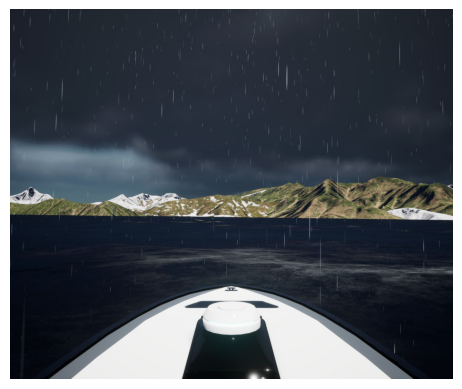

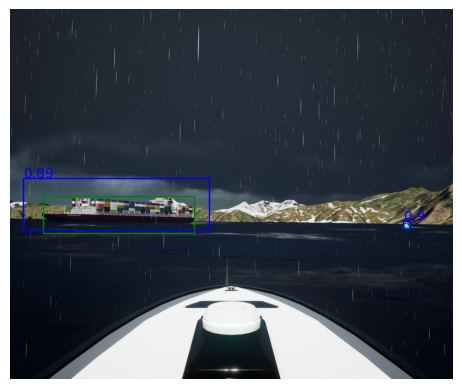

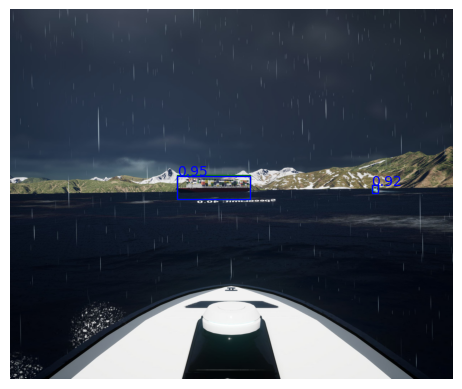

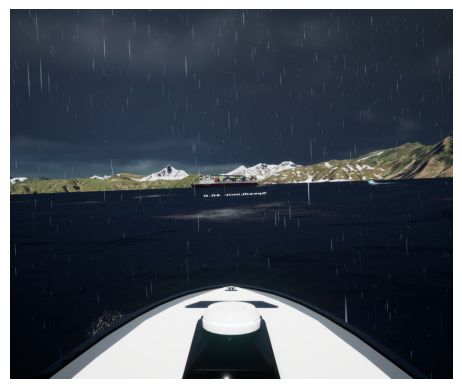

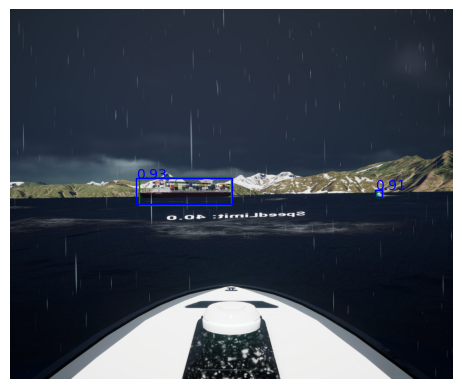

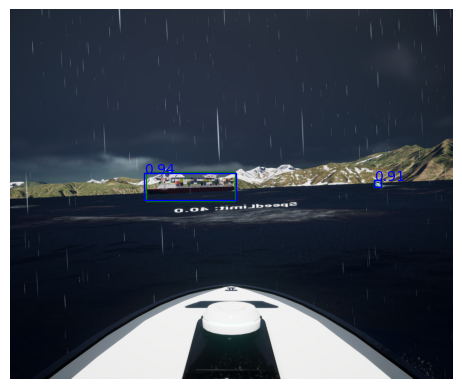

In [6]:
image_dir = GROUND_TRUTH_PATHS[0]+'/images/'

#['CAM00_img209', 'CAM00_img046', 'CAM00_img049', 'CAM00_img047']
for image in ['CAM00_img209', 'CAM00_img149', 'CAM00_img118','CAM00_img111', 'CAM00_img130', 'CAM00_img128']:
    display_predicted(image, image_dir, ground_truth_annots, predicted_detections, CONFIDENCE_THRESHOLD)

### Rain light 3

In [7]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_rain_light2.txt' imgsz=640 name=test_rain_light2 save=True save_conf=True save_txt=True


Displaying stats
Confusion matrix:
[[261  29]
 [ 82   0]]
Precision:
0.9
Recall:
0.760932944606414


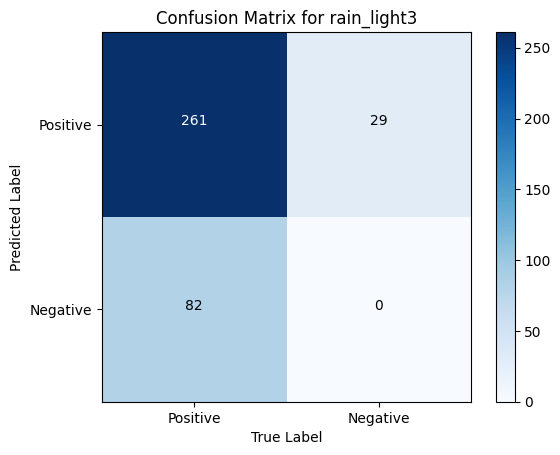

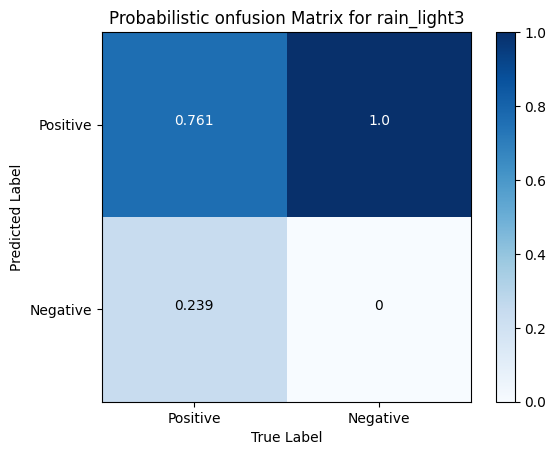

0.9 & 0.761 & 0.761 & 0.239 & 29


BOUNDING BOX ERRORS FOR rain_light3
IoU threshold:  0.5
Error of center x
261
Expected value: 2.48217370229007
Standard deviation: 32.37923956751444

Error of center y
100
Expected value: 5.98019795610687
Standard deviation: 20.01576121436374

Error of width
261
Expected value: -9.97962994656489
Standard deviation: 57.524835160669625

Error of height
104
Expected value: -2.4343086755725274
Standard deviation: 22.71635769720237
2.482 & 32.379 & 5.98 & 20.016 & -9.98 & 57.525 & -2.434 & 22.716


 DROPOUT STATS


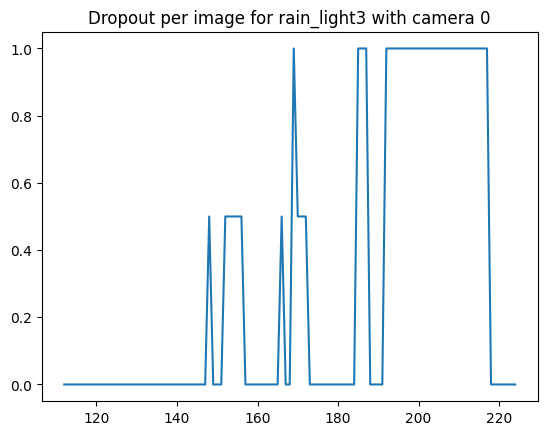

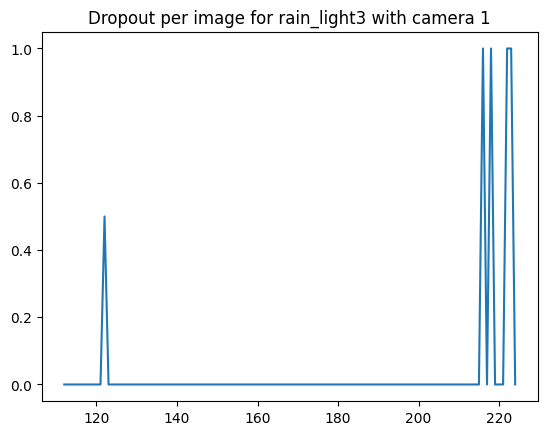

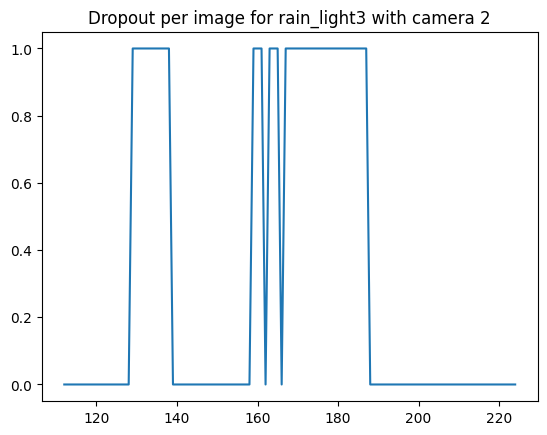

In [8]:
condition_name = 'rain_light3'
condition_folders = rain_light3
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

In [9]:
GROUND_TRUTH_PATHS

['/cluster/home/solveijm/DNV_synthetic_data_w_pose/2023-05-09_1313_dnv_scenario1_full_00_000_EveningCloudy_Rain']

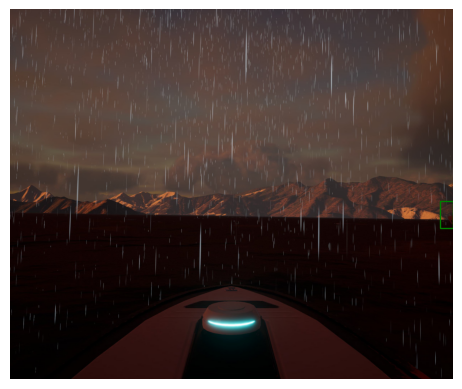

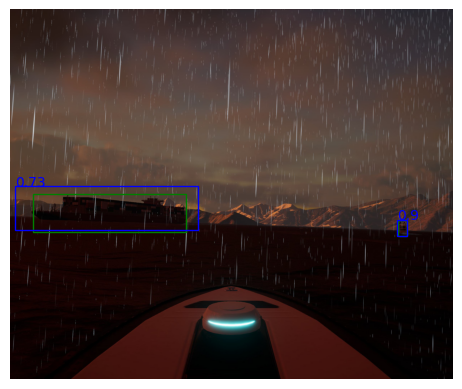

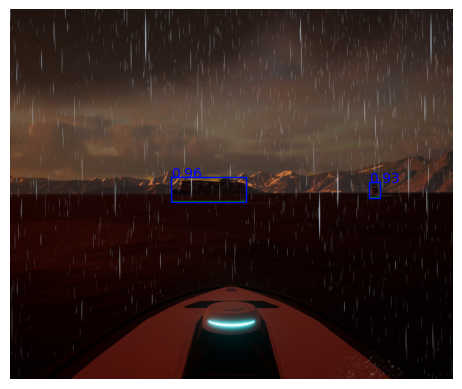

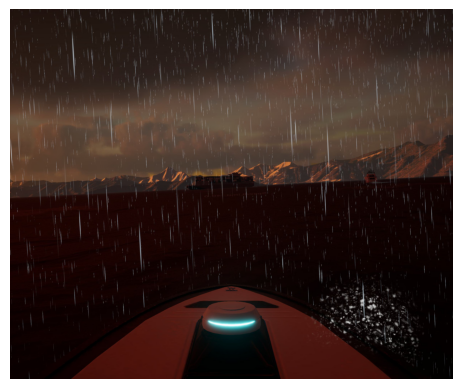

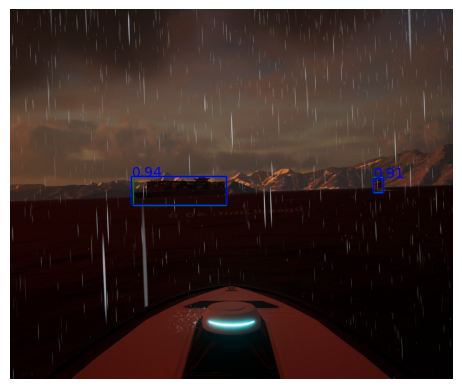

...

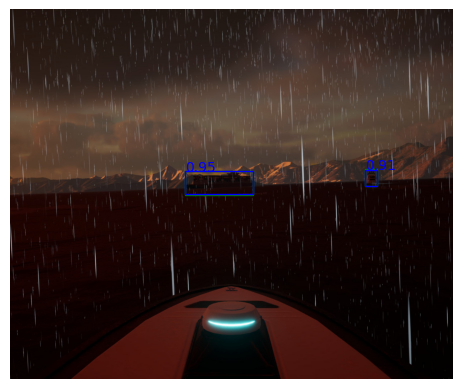

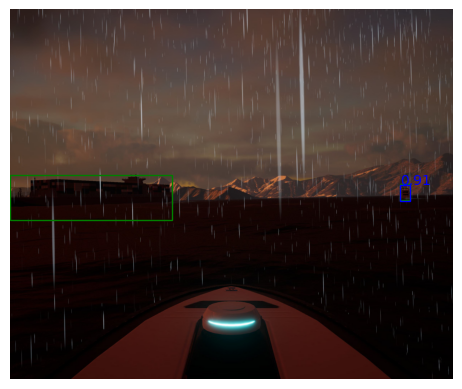

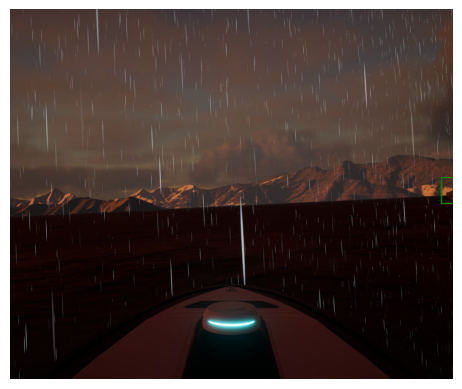

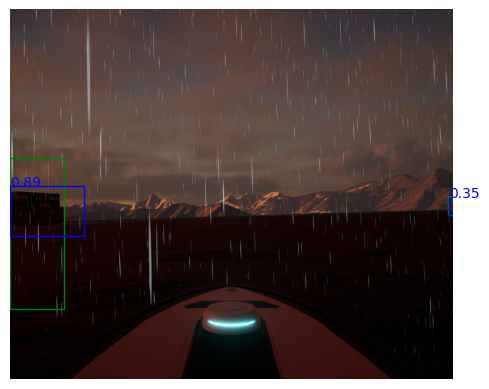

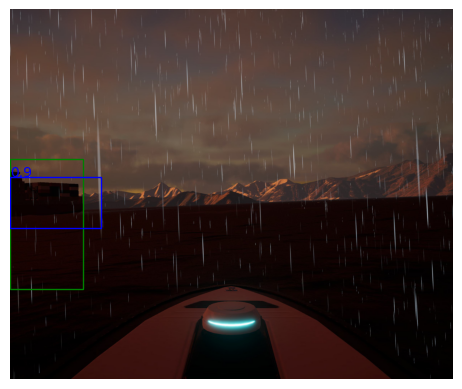

In [10]:
image_dir = GROUND_TRUTH_PATHS[0]+'/images/'

#['CAM00_img209', 'CAM00_img046', 'CAM00_img049', 'CAM00_img047']
for image in ['CAM00_img209', 'CAM00_img149', 'CAM00_img118','CAM00_img111', 'CAM00_img130', 'CAM00_img128', 'CAM00_img223', 'CAM00_img112', 'CAM00_img152','CAM00_img201', 'CAM00_img170', 'CAM00_img169']:
    display_predicted(image, image_dir, ground_truth_annots, predicted_detections, CONFIDENCE_THRESHOLD)

## Fog

In [33]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_foggy.txt' imgsz=640 name=test_foggy save=True save_conf=True save_txt=True


Displaying stats
Confusion matrix:
[[220  24]
 [115   0]]
Precision:
0.9016393442622951
Recall:
0.6567164179104478


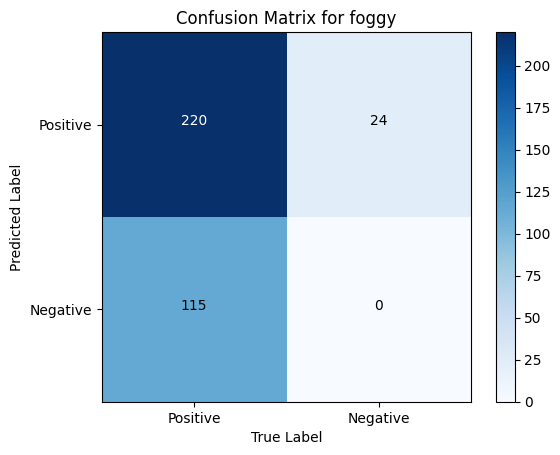

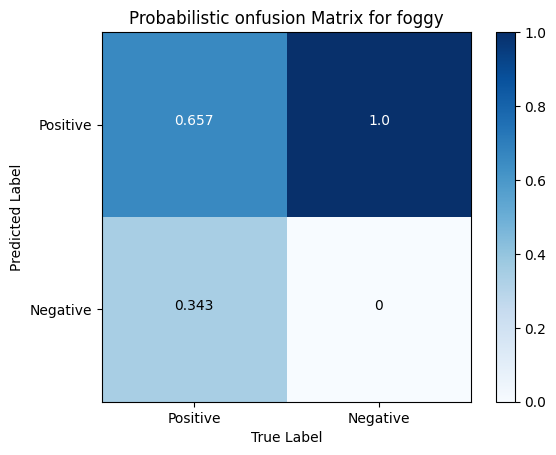

0.902 & 0.657 & 0.657 & 0.343 & 24


BOUNDING BOX ERRORS FOR foggy
IoU threshold:  0.5
Error of center x
219
Expected value: 5.290733119909502
Standard deviation: 47.60039365076943

Error of center y
73
Expected value: 0.24995127375566056
Standard deviation: 13.046607717822571

Error of width
219
Expected value: 7.807421941176473
Standard deviation: 65.62370522934489

Error of height
220
Expected value: 2.577783398190048
Standard deviation: 23.563766252241372
5.291 & 47.6 & 0.25 & 13.047 & 7.807 & 65.624 & 2.578 & 23.564


 DROPOUT STATS


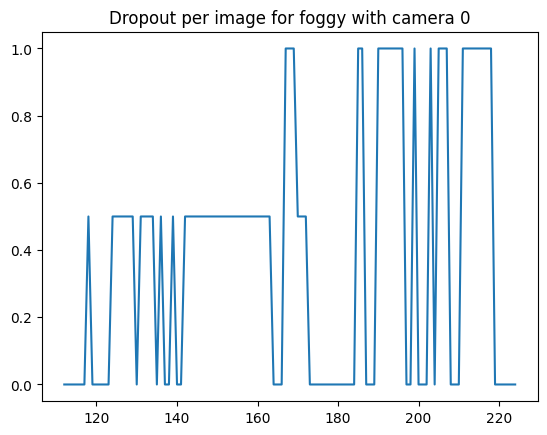

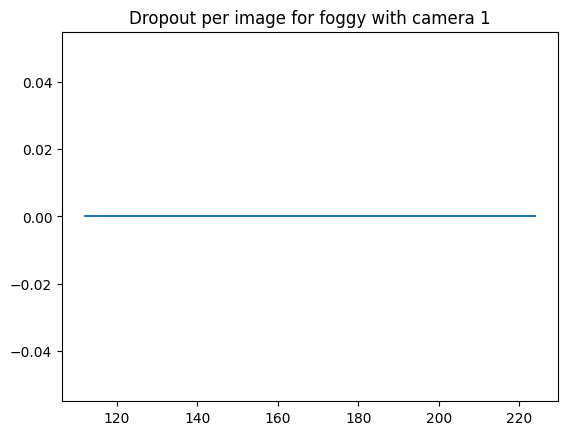

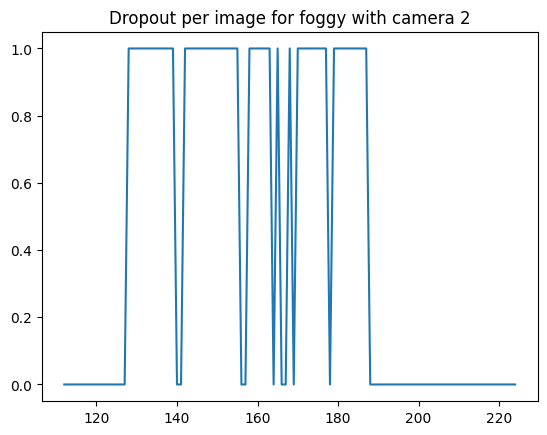

In [52]:
condition_name = 'foggy'
condition_folders = foggy
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

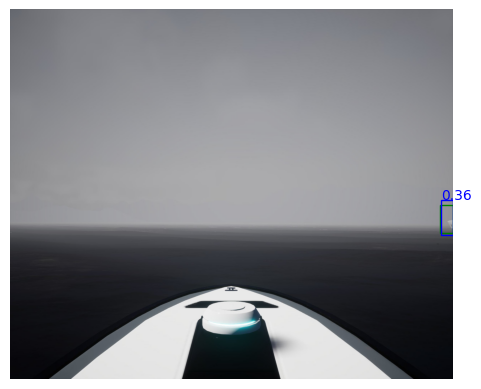

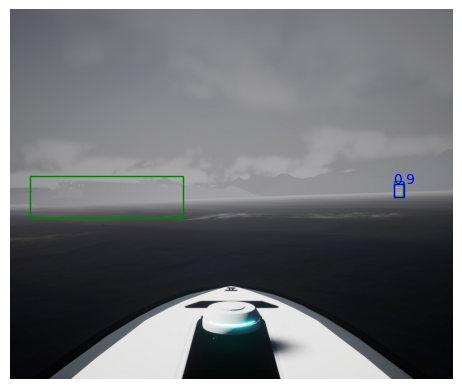

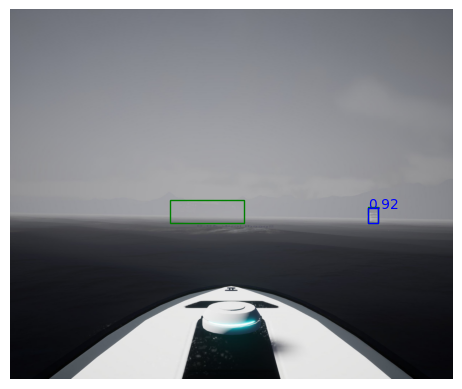

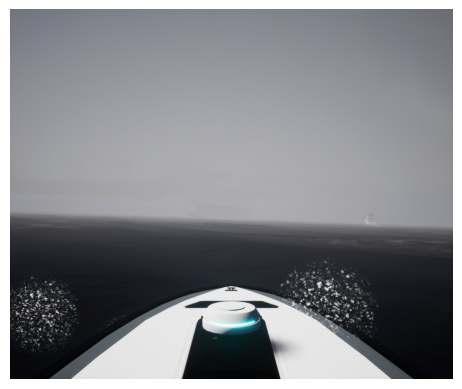

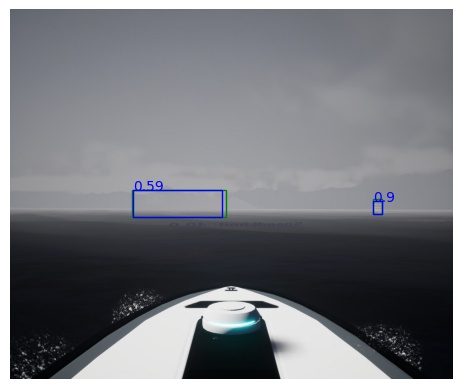

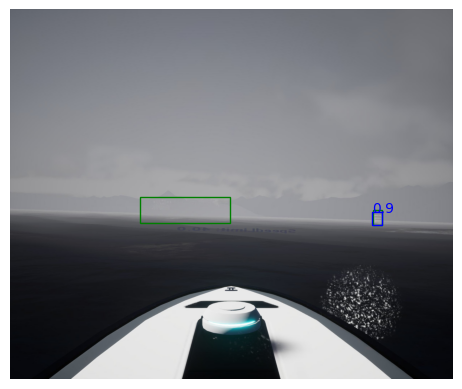

In [53]:
image_dir = GROUND_TRUTH_PATHS[0]+'/images/'

#['CAM00_img209', 'CAM00_img046', 'CAM00_img049', 'CAM00_img047']
for image in ['CAM00_img209', 'CAM00_img149', 'CAM00_img118','CAM00_img111', 'CAM00_img130', 'CAM00_img128']:
    display_predicted(image, image_dir, ground_truth_annots, predicted_detections, CONFIDENCE_THRESHOLD)

## Fog and clouds

In [35]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_foggy.txt' imgsz=640 name=test_foggy save=True save_conf=True save_txt=True


Displaying stats
Confusion matrix:
[[193  66]
 [119   0]]
Precision:
0.7451737451737451
Recall:
0.6185897435897436


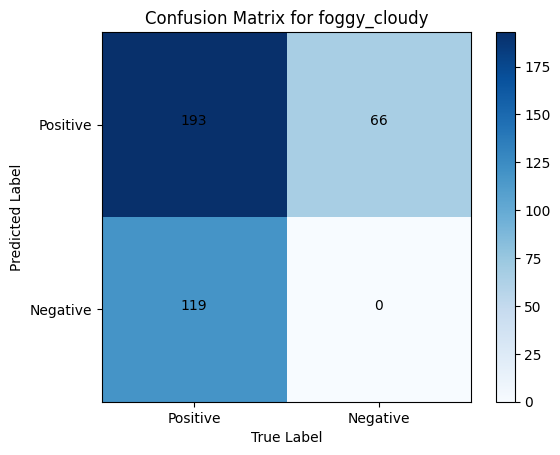

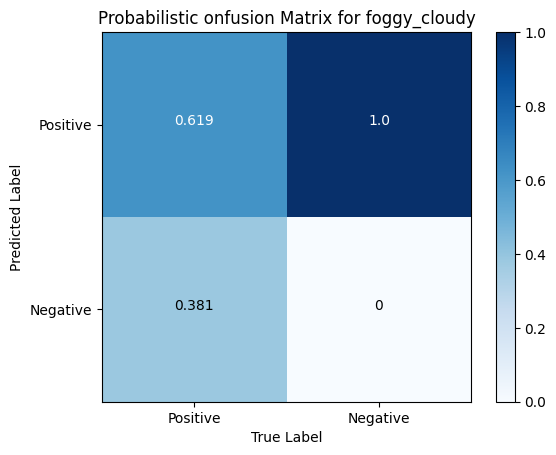

0.745 & 0.619 & 0.619 & 0.381 & 66


BOUNDING BOX ERRORS FOR foggy_cloudy
IoU threshold:  0.5
Error of center x
192
Expected value: 3.9632032435233175
Standard deviation: 41.939991868056545

Error of center y
82
Expected value: 8.221870818652851
Standard deviation: 18.298581658820105

Error of width
192
Expected value: -24.06200853886011
Standard deviation: 71.7334311414445

Error of height
104
Expected value: -8.949465751295334
Standard deviation: 29.735547581801868
3.963 & 41.94 & 8.222 & 18.299 & -24.062 & 71.733 & -8.949 & 29.736


 DROPOUT STATS


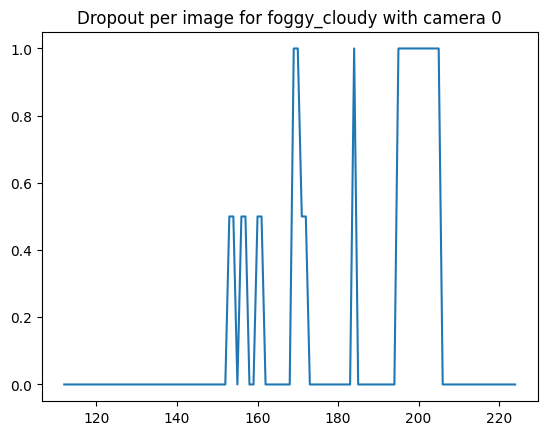

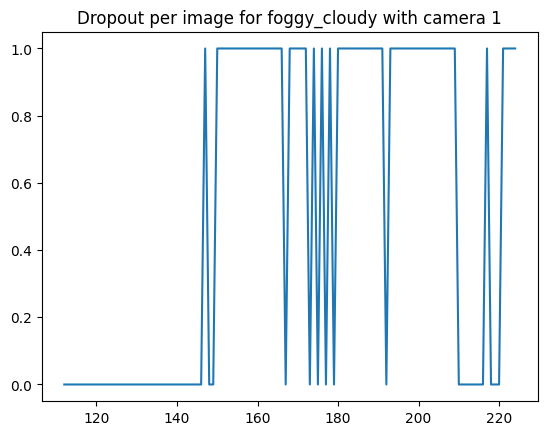

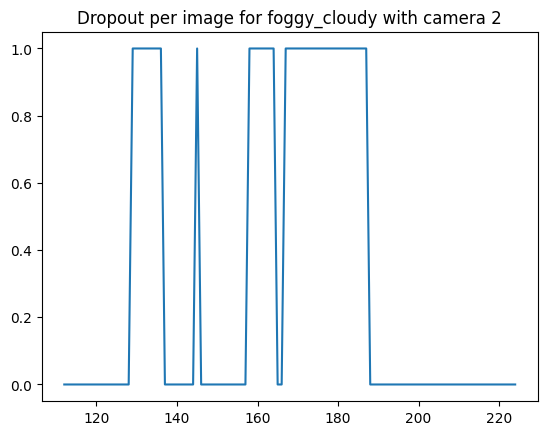

In [54]:
condition_name = 'foggy_cloudy'
condition_folders = foggy_cloudy
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

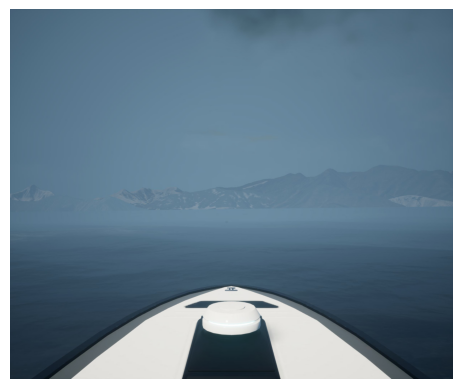

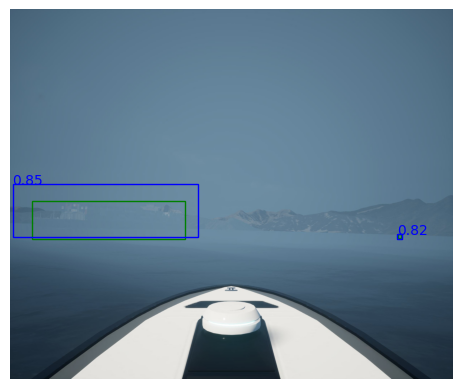

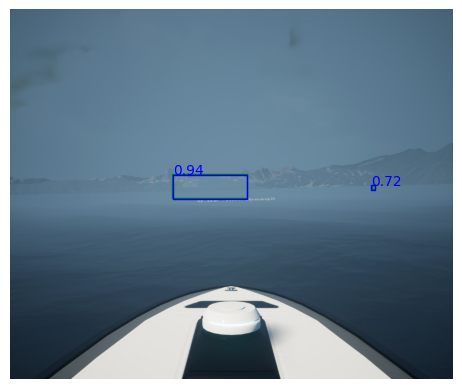

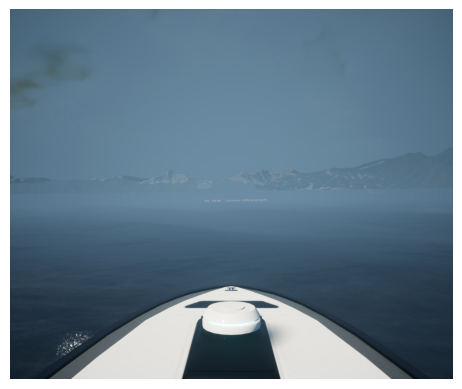

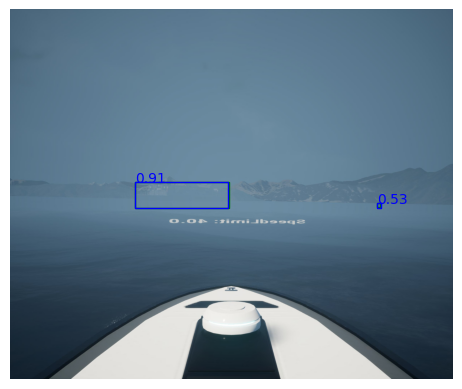

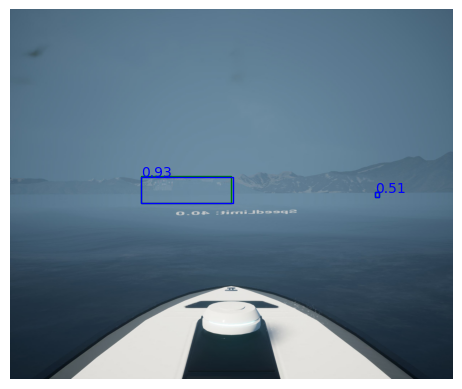

In [55]:
image_dir = GROUND_TRUTH_PATHS[0]+'/images/'

#['CAM00_img209', 'CAM00_img046', 'CAM00_img049', 'CAM00_img047']
for image in ['CAM00_img209', 'CAM00_img149', 'CAM00_img118','CAM00_img111', 'CAM00_img130', 'CAM00_img128']:
    display_predicted(image, image_dir, ground_truth_annots, predicted_detections, CONFIDENCE_THRESHOLD)

## Stormy

In [37]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_stormy.txt' imgsz=640 name=test_stormy save=True save_conf=True save_txt=True


Displaying stats
Confusion matrix:
[[273  34]
 [ 58   0]]
Precision:
0.8892508143322475
Recall:
0.824773413897281


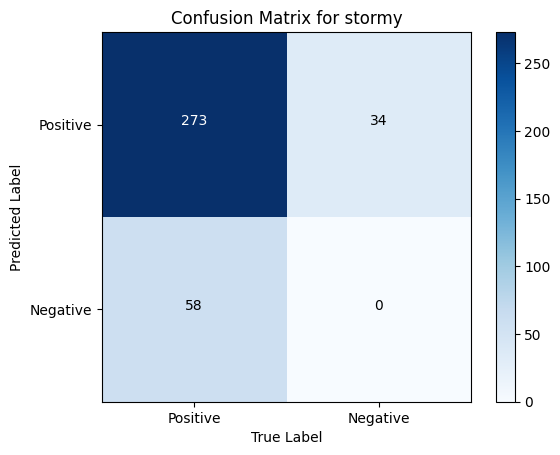

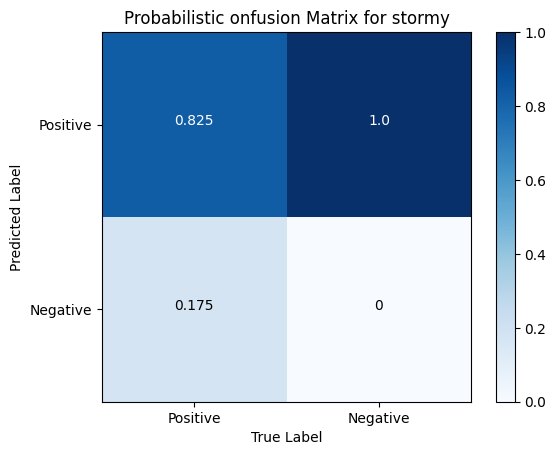

0.889 & 0.825 & 0.825 & 0.175 & 34


BOUNDING BOX ERRORS FOR stormy
IoU threshold:  0.5
Error of center x
272
Expected value: -4.704888494718313
Standard deviation: 72.5711195390423

Error of center y
110
Expected value: 10.165492584507048
Standard deviation: 25.10948970464926

Error of width
273
Expected value: 4.32393859507042
Standard deviation: 102.52015528668456

Error of height
282
Expected value: -11.12124130281689
Standard deviation: 44.68077662025838
-4.705 & 72.571 & 10.165 & 25.109 & 4.324 & 102.52 & -11.121 & 44.681


 DROPOUT STATS


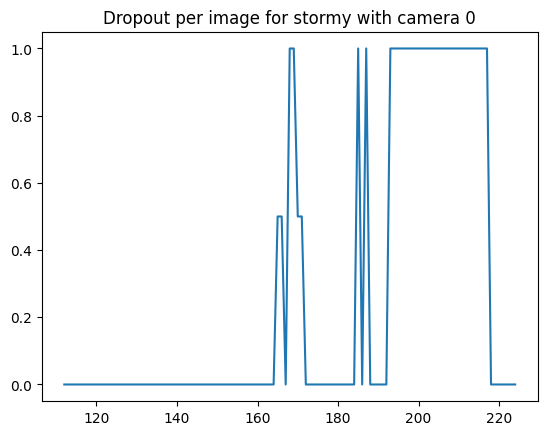

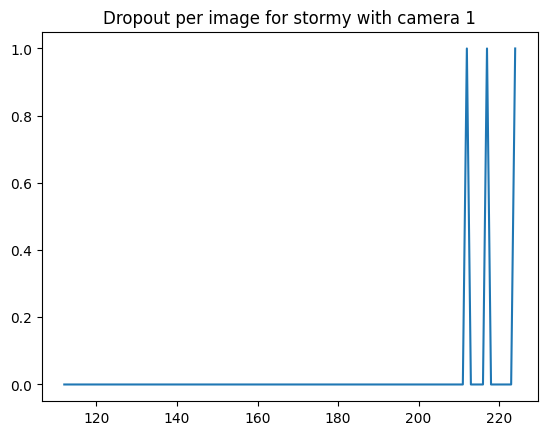

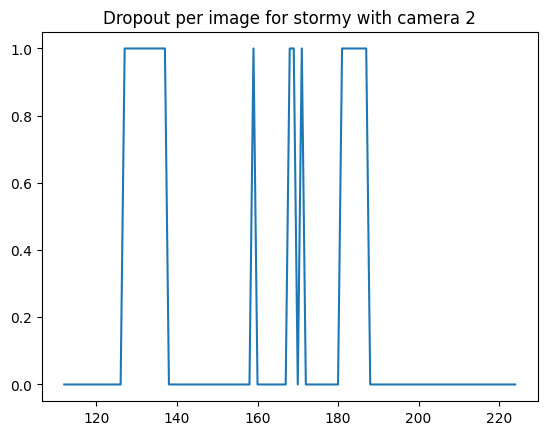

In [56]:
condition_name = 'stormy'
condition_folders = stormy
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

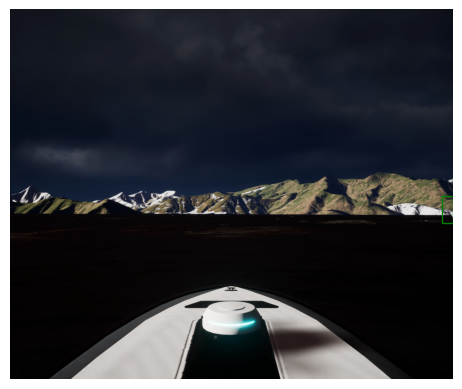

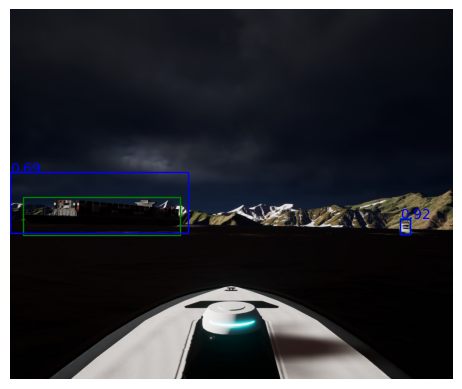

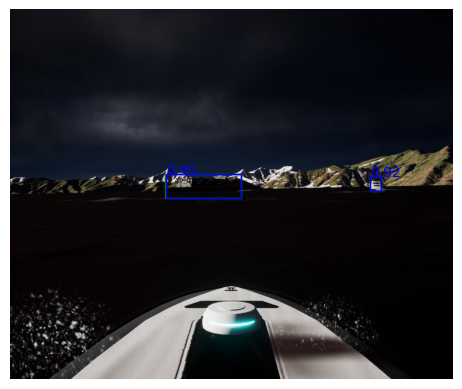

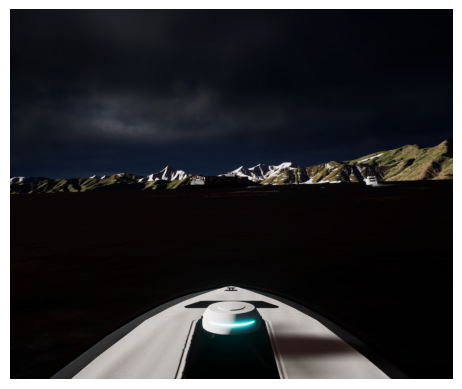

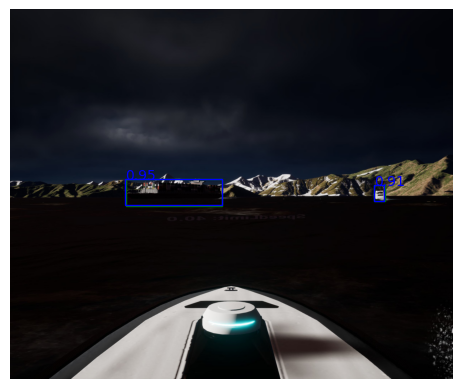

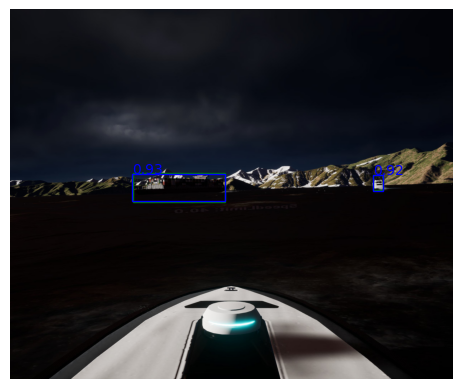

In [57]:
image_dir = GROUND_TRUTH_PATHS[0]+'/images/'

#['CAM00_img209', 'CAM00_img046', 'CAM00_img049', 'CAM00_img047']
for image in ['CAM00_img209', 'CAM00_img149', 'CAM00_img118','CAM00_img111', 'CAM00_img130', 'CAM00_img128']:
    display_predicted(image, image_dir, ground_truth_annots, predicted_detections, CONFIDENCE_THRESHOLD)

## Stormy and rain

In [39]:
#!yolo task=detect mode=predict model=/cluster/work/solveijm/MODSIM/runs/detect/train_1cls_50e_640imgsz_synthetic/weights/best.pt source='/cluster/home/solveijm/DNV_data/test_stormy_rain.txt' imgsz=640 name=test_stormy_rain save=True save_conf=True save_txt=True


Displaying stats
Confusion matrix:
[[243  23]
 [ 65   0]]
Precision:
0.9135338345864662
Recall:
0.788961038961039


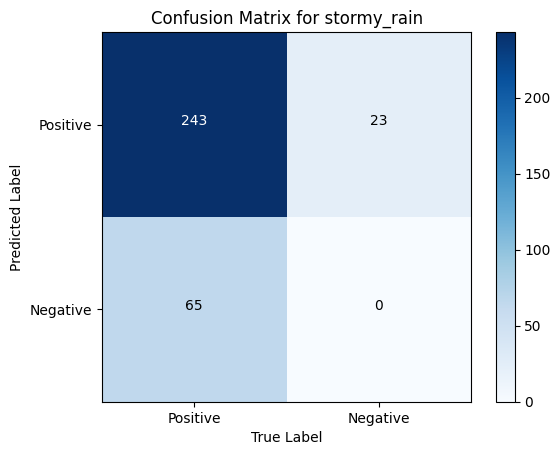

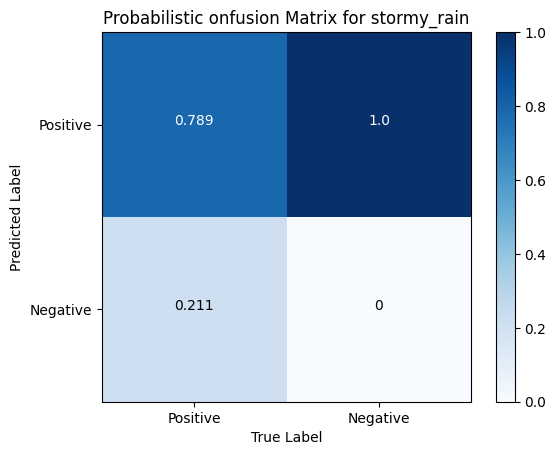

0.914 & 0.789 & 0.789 & 0.211 & 23


BOUNDING BOX ERRORS FOR stormy_rain
IoU threshold:  0.5
Error of center x
240
Expected value: -5.838199416326531
Standard deviation: 41.50393224447291

Error of center y
102
Expected value: 9.260648626530617
Standard deviation: 23.894248804769223

Error of width
243
Expected value: -3.2758684897959176
Standard deviation: 63.726467699185626

Error of height
102
Expected value: -4.837335293877551
Standard deviation: 25.578664085837122
-5.838 & 41.504 & 9.261 & 23.894 & -3.276 & 63.726 & -4.837 & 25.579


 DROPOUT STATS


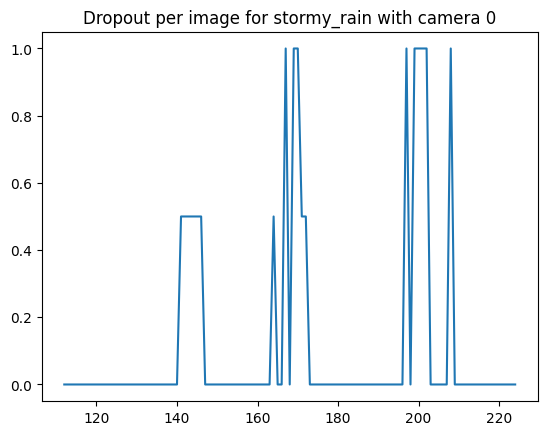

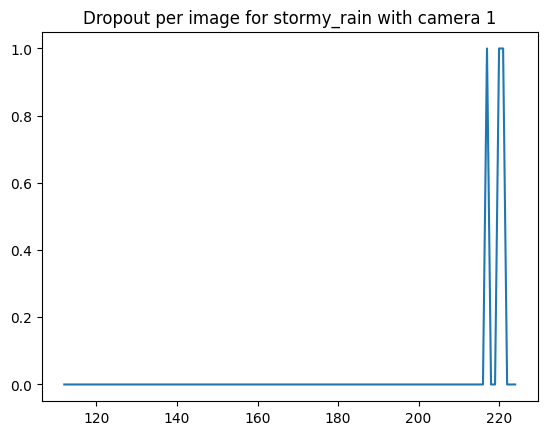

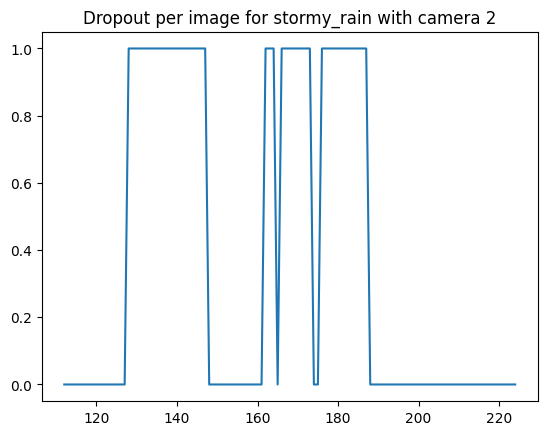

In [58]:
condition_name = 'stormy_rain'
condition_folders = stormy_rain
GROUND_TRUTH_PATHS = [os.path.join(SYNTETIC_DATA_DIRECTORY, folder) for folder in condition_folders]
PREDICTED_PATH = f'../../runs/detect/test_induvidual_contions_1024imgz_hurtigruta_and_synthetic_18_05/test_{condition_name}/labels'

ground_truth_annots, predicted_detections = display_stats_main(GROUND_TRUTH_PATHS, PREDICTED_PATH, iou_treshold, CONFIDENCE_THRESHOLD, IMAGE_WIDTH, IMAGE_HEIGHT, name=condition_name)

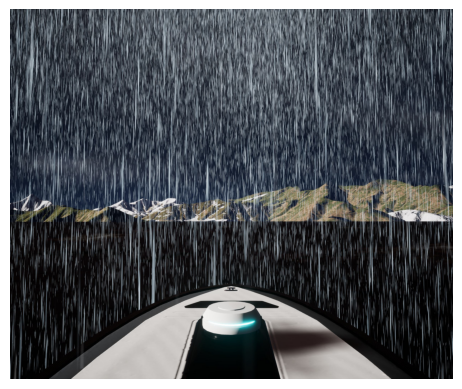

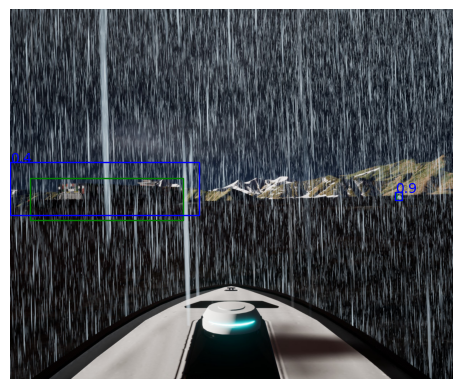

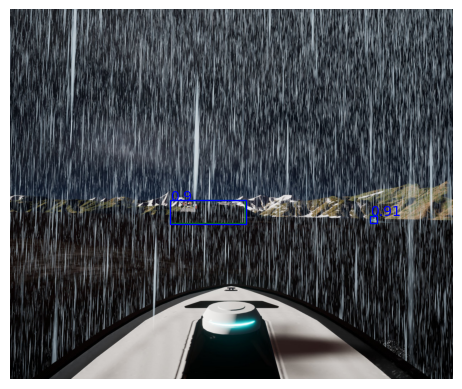

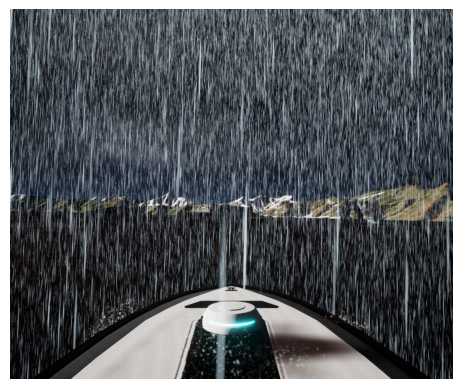

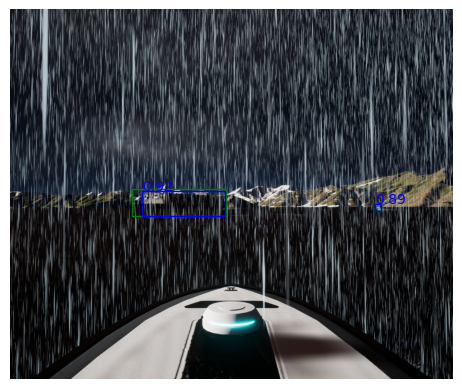

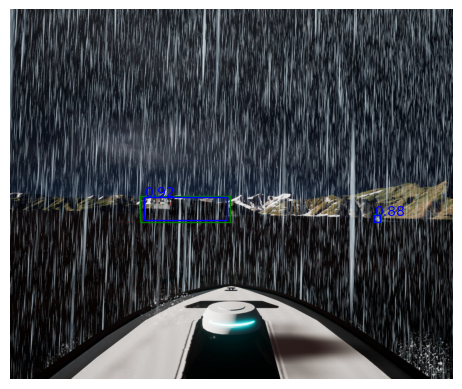

In [59]:
image_dir = GROUND_TRUTH_PATHS[0]+'/images/'

#['CAM00_img209', 'CAM00_img046', 'CAM00_img049', 'CAM00_img047']
for image in ['CAM00_img209', 'CAM00_img149', 'CAM00_img118','CAM00_img111', 'CAM00_img130', 'CAM00_img128']:
    display_predicted(image, image_dir, ground_truth_annots, predicted_detections, CONFIDENCE_THRESHOLD)